In [1]:
from PIL import Image
import os
import pandas as pd
import numpy as np
import datasets
from tqdm import tqdm
from datasets import Image as Image_ds # change name because of similar PIL module
from datasets import Dataset
from datasets import load_dataset
import urllib.parse
import json
import pickle
import requests
import matplotlib.pyplot as plt 
from sklearn.neighbors import NearestNeighbors
import re
import sys
sys.path.append(os.path.abspath(".."))
from src.utils import plot_neighbors, pca_binary, plot_pca_scale, plot_dendrogram
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from matplotlib.patches import Patch
from random import sample
from scipy.cluster.hierarchy import linkage, dendrogram
from matplotlib.patches import Patch
from sklearn.metrics.pairwise import cosine_distances
import seaborn as sns
from scipy.stats import spearmanr
from sklearn.utils import resample

#sys.path.append(os.path.abspath(".."))
from src.utils import WindowedRollingDistance
from src.utils import calc_vector_histogram
from scipy.ndimage import gaussian_filter1d

# we get a lot of annoying warnings from sklearn so we suppress them
import warnings
warnings.filterwarnings('ignore')

/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
with open("custom_requirements.txt") as f:
    print(f.read())

### Load data

We load the SMK data + metadata in a couple of different formats:

df = Pandas DataFrame with SMK metadata on paintings

ds = HuggingFace dataset with same columns as pandas DF, but also a column storing a PIL image of the painting (mainly used here as it's easy to check the painting when it's stored in a ds)

In [2]:
# read df from pickle 
data_path = os.path.join('..', 'data')
df = pd.read_pickle(os.path.join(data_path, 'paintings_canonized.pkl'))

In [3]:
# load image data
ds = load_dataset("louisebrix/smk_only_paintings", split="train") # all the data is in the 'train' split

### Sanity check image embeddings

Image embeddings are obtained by running the scripts 'src/smk_embeddings.py' and 'src/greyscale_embeddings.py'. The pretrained model used is EVA-02-CLIP, a multimodal vision transformer architecture. The embeddings are saved as .npy files in the /data folder but are loaded here as a column in the dataframe. There's two types of embeddings:
- 'as they are' i.e., embeddings extracted from the downloaded image from SMK
- greyscaled embeddings: SMK are first converted to greyscale, then embeddings are extracted from the greyscaled images.

As a type of sanity check, we make sure that our embeddings actually capture image content and style by running a kNN algorithm to find the nearest neighbors based on embeddings:

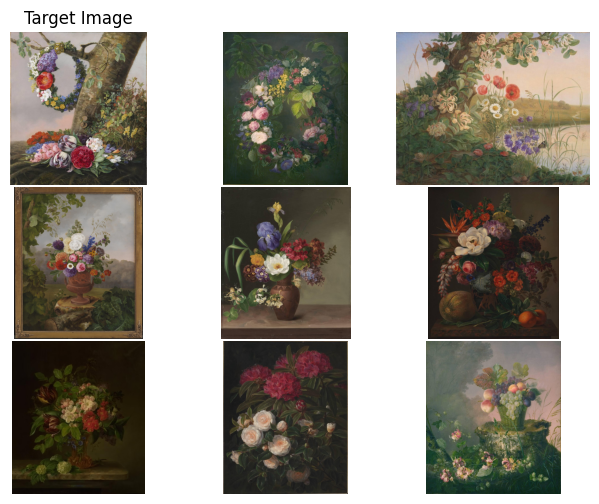

In [592]:
feature_list = np.array(df['embedding'].tolist())
plot_neighbors(feature_list, 80, ds) # choose random image as target image

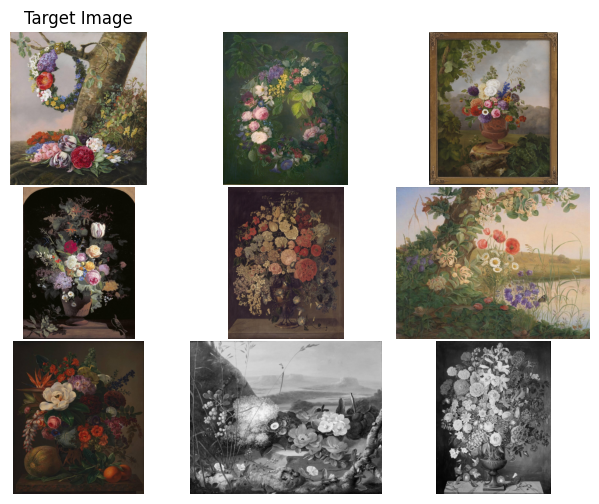

In [593]:
grey_feature_list = np.array(df['grey_embedding'].tolist())
plot_neighbors(grey_feature_list, 80, ds) # choose random image as target image

(Should be noted that I have not changed the actual PIL image to greyscale in the dataset, only done it before extracting the embedding, i.e., have not saved the greyscaled image. That is why the images are still colored)

### Create subset of colored images only

In [4]:
# make subset of colored images only 
color_subset = df.query('rgb == "color"')
color_idx = color_subset.index.tolist()
ds_color = ds.select(color_idx)
color_subset.reset_index(drop=True, inplace=True)

## PCA

Testing PCA plots with a continuous canon variable by coloring by number of exhibitions:

Text(0.5, 0.98, 'PCA colored by number of exhibitions')

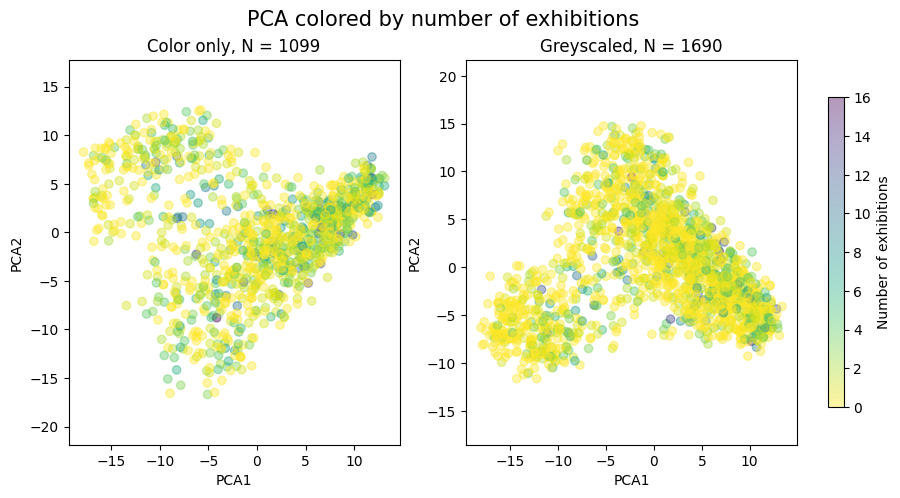

In [600]:
exb_df = df.fillna(0)
exb_color = color_subset.fillna(0)

# coloring by number of exhibitions
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
sc1 = plot_pca_scale(axs[0], exb_color, 'embedding', "n_exhibitions", f"Color only, N = {len(color_subset)}", cmap='viridis_r')
sc2 = plot_pca_scale(axs[1], exb_df, 'grey_embedding', "n_exhibitions", f"Greyscaled, N = {len(df)}", cmap='viridis_r')

# add colorbar
cbar = fig.colorbar(sc1, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label("Number of exhibitions")
fig.suptitle('PCA colored by number of exhibitions', size = 15)

### PCA plots per category

Text(0.5, 0.95, 'PCA with Binary Canon Definition by category')

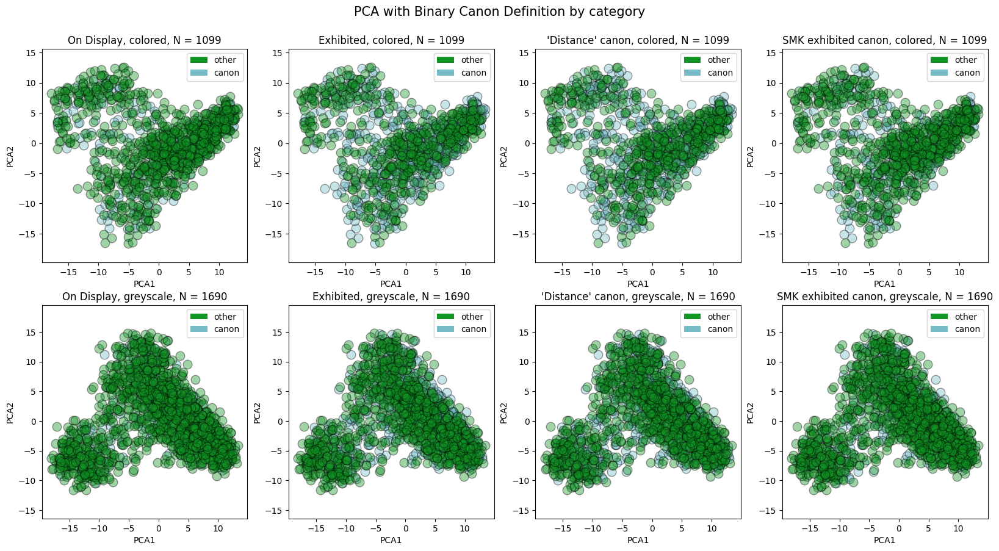

In [601]:
# PCA plots with binary canon variables
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

pca_binary(axs[0,0], color_subset, 'embedding', "on_display", f"On Display, colored, N = {len(color_subset)}")
pca_binary(axs[1,0], df, 'grey_embedding', "on_display", f"On Display, greyscale, N = {len(df)}")
pca_binary(axs[0,1], color_subset, 'embedding', "exb_canon", f"Exhibited, colored, N = {len(color_subset)}")
pca_binary(axs[1,1], df, 'grey_embedding', "exb_canon", f"Exhibited, greyscale, N = {len(df)}")
pca_binary(axs[0,2], color_subset, 'embedding', "dist_canon", f"'Distance' canon, colored, N = {len(color_subset)}")
pca_binary(axs[1,2], df, 'grey_embedding', "dist_canon", f"'Distance' canon, greyscale, N = {len(df)}")
pca_binary(axs[0,3], color_subset, 'embedding', "smk_exhibitions", f"SMK exhibited canon, colored, N = {len(color_subset)}")
pca_binary(axs[1,3], df, 'grey_embedding', "smk_exhibitions", f"SMK exhibited canon, greyscale, N = {len(df)}")
fig.suptitle('PCA with Binary Canon Definition by category', size = 15, y=0.95)

### Plot PCA embeddings for first and last part of the dataset

In [602]:
# dividing the dataset based on the median
df['start_year'].describe()

count    1690.000000
mean     1822.861538
std        30.666656
min      1750.000000
25%      1807.000000
50%      1831.500000
75%      1845.000000
max      1870.000000
Name: start_year, dtype: float64

In [603]:
first_half_grey = df.query("start_year < 1831")
second_half_grey = df.query("start_year >= 1831")
len(df) == len(first_half_grey) + len(second_half_grey)

True

In [604]:
# get median for color-subset
color_subset['start_year'].describe()

count    1099.000000
mean     1826.242948
std        28.882151
min      1750.000000
25%      1812.000000
50%      1834.000000
75%      1846.000000
max      1870.000000
Name: start_year, dtype: float64

In [605]:
first_half_color = color_subset.query("start_year < 1834")
second_half_color = color_subset.query("start_year >= 1834")

len(color_subset) == len(first_half_color) + len(second_half_color)

True

Text(0.5, 0.95, 'PCA with "distance" canon, first and second half of dataset')

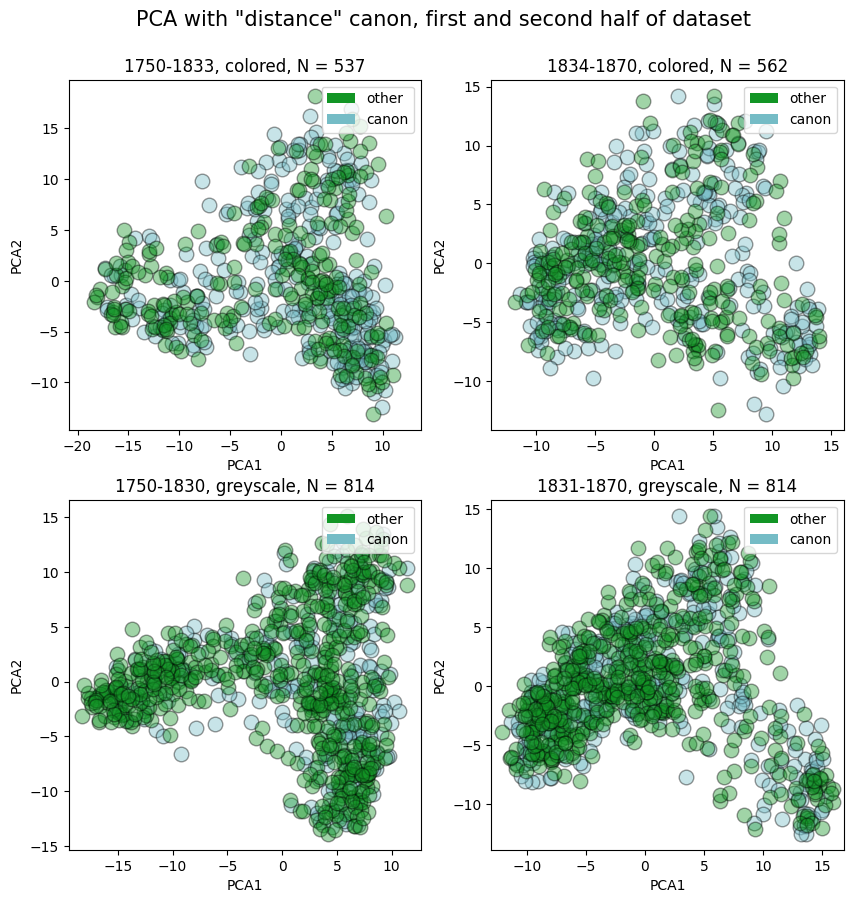

In [606]:
# Plot PCA per category

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

pca_binary(axs[0,0], first_half_color, 'embedding', "dist_canon", f"1750-1833, colored, N = {len(first_half_color)}")
pca_binary(axs[0,1], second_half_color, 'embedding', "dist_canon", f"1834-1870, colored, N = {len(second_half_color)}")
pca_binary(axs[1,0], first_half_grey, 'grey_embedding', "dist_canon", f"1750-1830, greyscale, N = {len(first_half_grey)}")
pca_binary(axs[1,1], second_half_grey, 'grey_embedding', "dist_canon", f"1831-1870, greyscale, N = {len(first_half_grey)}")

fig.suptitle('PCA with "distance" canon, first and second half of dataset', size = 15, y=0.95)

Text(0.5, 0.95, 'PCA with Exhibition canon, first and second half of dataset')

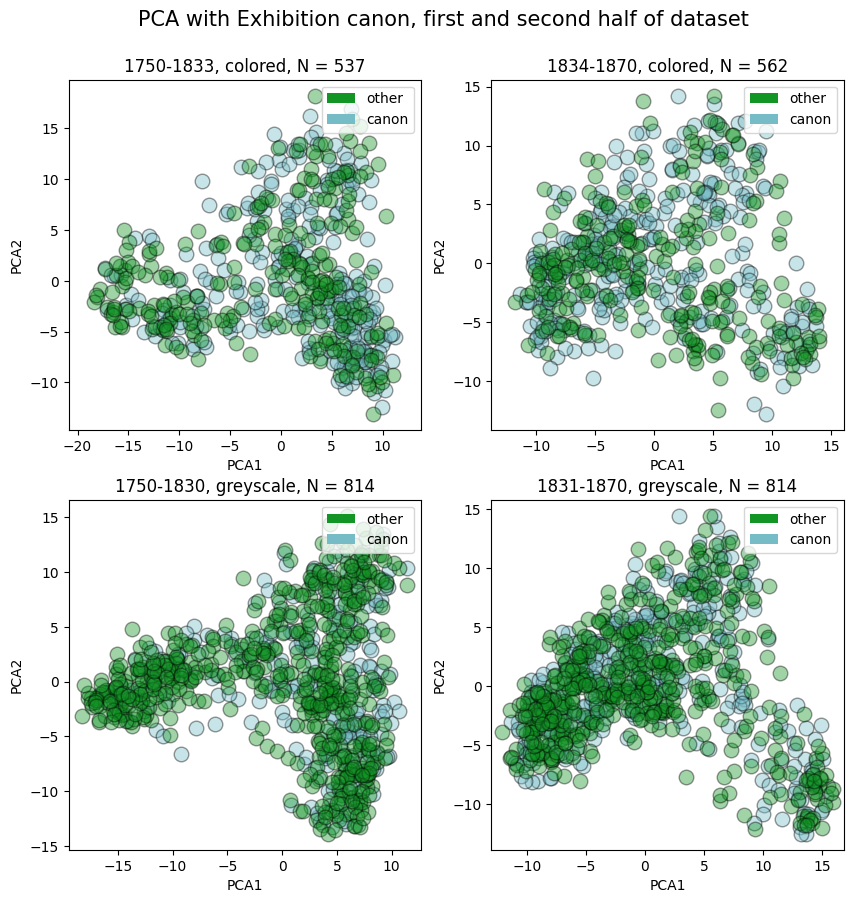

In [607]:
# Plot PCA per category

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

pca_binary(axs[0,0], first_half_color, 'embedding', "exb_canon", f"1750-1833, colored, N = {len(first_half_color)}")
pca_binary(axs[0,1], second_half_color, 'embedding', "exb_canon", f"1834-1870, colored, N = {len(second_half_color)}")
pca_binary(axs[1,0], first_half_grey, 'grey_embedding', "exb_canon", f"1750-1830, greyscale, N = {len(first_half_grey)}")
pca_binary(axs[1,1], second_half_grey, 'grey_embedding', "exb_canon", f"1831-1870, greyscale, N = {len(first_half_grey)}")

fig.suptitle('PCA with Exhibition canon, first and second half of dataset', size = 15, y=0.95)

Text(0.5, 0.95, 'PCA with SMK Exhibitions canon, first and second half of dataset')

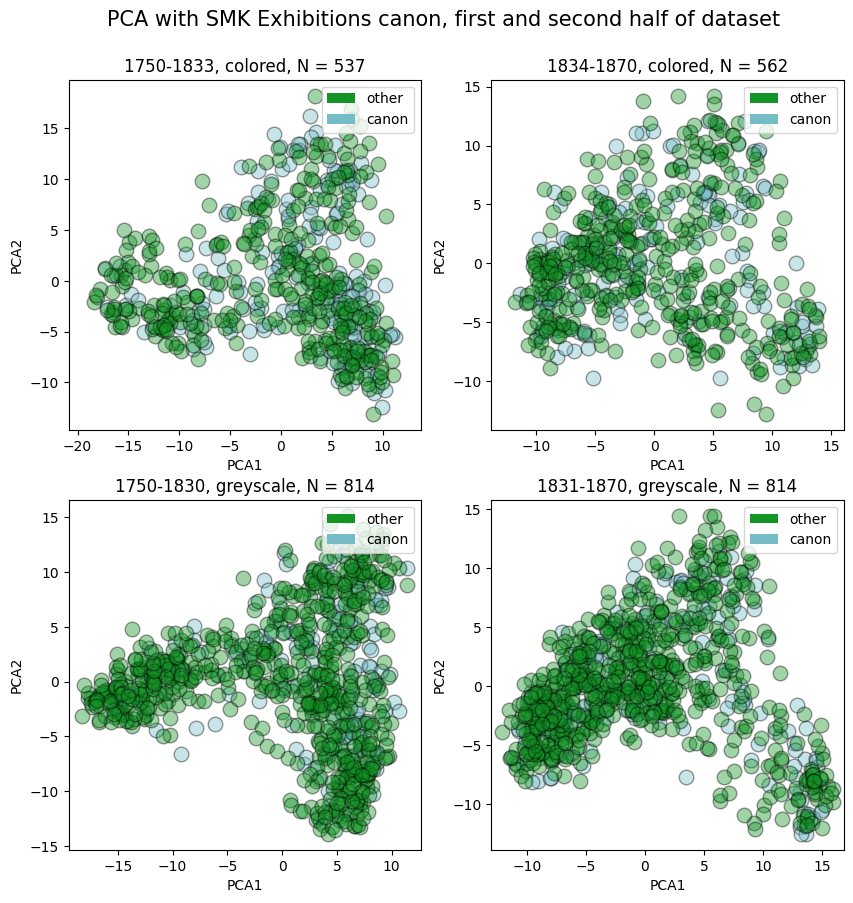

In [608]:
# Plot PCA per category

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

pca_binary(axs[0,0], first_half_color, 'embedding', "smk_exhibitions", f"1750-1833, colored, N = {len(first_half_color)}")
pca_binary(axs[0,1], second_half_color, 'embedding', "smk_exhibitions", f"1834-1870, colored, N = {len(second_half_color)}")
pca_binary(axs[1,0], first_half_grey, 'grey_embedding', "smk_exhibitions", f"1750-1830, greyscale, N = {len(first_half_grey)}")
pca_binary(axs[1,1], second_half_grey, 'grey_embedding', "smk_exhibitions", f"1831-1870, greyscale, N = {len(first_half_grey)}")

fig.suptitle('PCA with SMK Exhibitions canon, first and second half of dataset', size = 15, y=0.95)

Text(0.5, 0.95, 'PCA with On Display canon, first and second half of dataset')

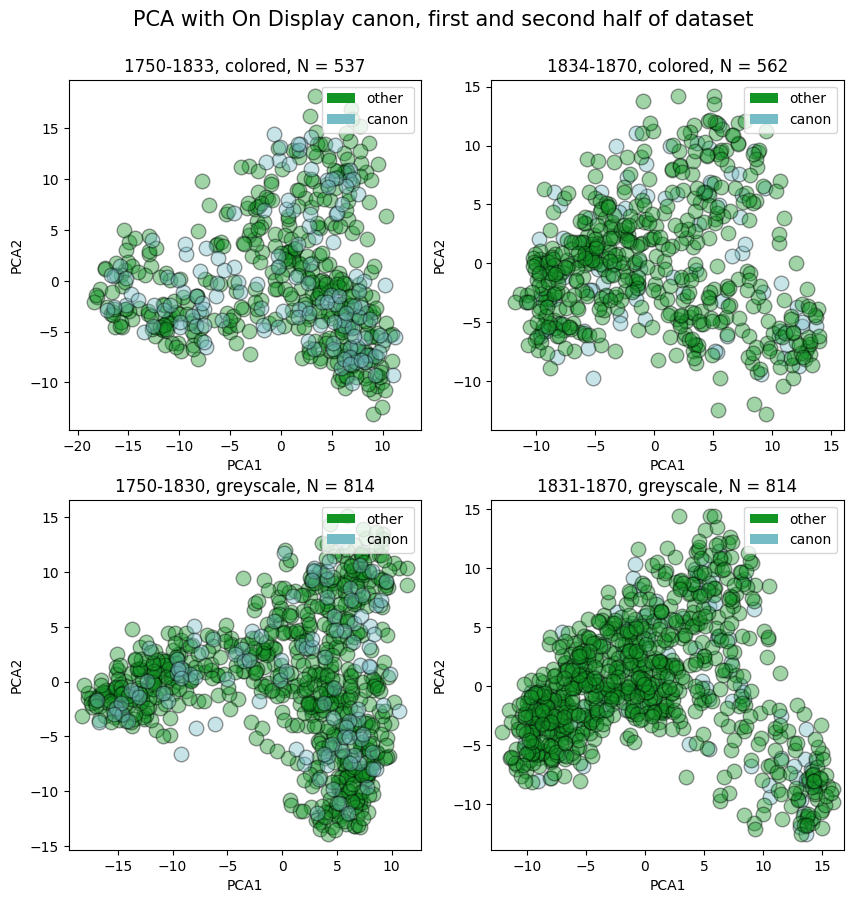

In [609]:
# Plot PCA per category

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

pca_binary(axs[0,0], first_half_color, 'embedding', "on_display", f"1750-1833, colored, N = {len(first_half_color)}")
pca_binary(axs[0,1], second_half_color, 'embedding', "on_display", f"1834-1870, colored, N = {len(second_half_color)}")
pca_binary(axs[1,0], first_half_grey, 'grey_embedding', "on_display", f"1750-1830, greyscale, N = {len(first_half_grey)}")
pca_binary(axs[1,1], second_half_grey, 'grey_embedding', "on_display", f"1831-1870, greyscale, N = {len(first_half_grey)}")

fig.suptitle('PCA with On Display canon, first and second half of dataset', size = 15, y=0.95)

In [610]:
first_half_color_nona = color_subset.query("start_year < 1834").fillna(0)
second_half_color_nona = color_subset.query("start_year >= 1834").fillna(0)
first_half_grey_nona = df.query("start_year < 1831").fillna(0)
second_half_grey_nona = df.query("start_year >= 1831").fillna(0)

Text(0.5, 0.95, 'PCA colored by number of exhibitions, divided by years')

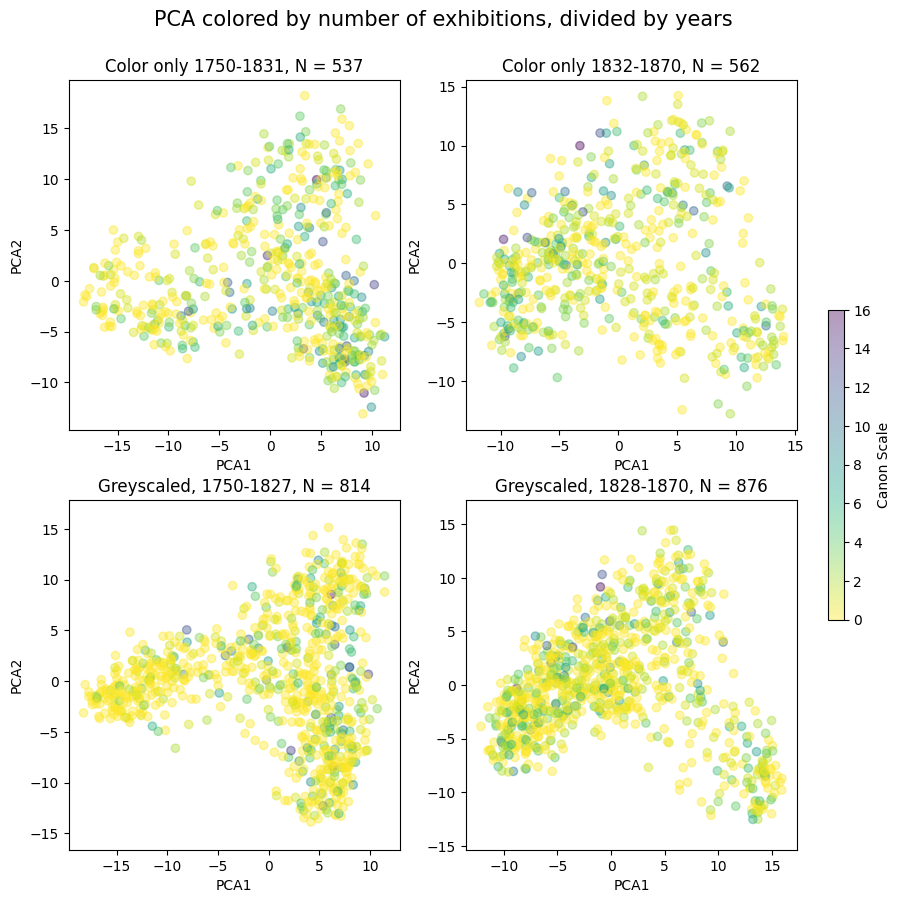

In [611]:
# PCA plots with canon scale
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

sc1 = plot_pca_scale(axs[0,0], first_half_color_nona, 'embedding', "n_exhibitions", f"Color only 1750-1831, N = {len(first_half_color)}", cmap='viridis_r')
sc2 = plot_pca_scale(axs[0,1], second_half_color_nona, 'embedding', 'n_exhibitions', f"Color only 1832-1870, N = {len(second_half_color)}", cmap='viridis_r')
sc3 = plot_pca_scale(axs[1,0], first_half_grey_nona, 'grey_embedding', "n_exhibitions", f"Greyscaled, 1750-1827, N = {len(first_half_grey)}", cmap='viridis_r')
sc4 = plot_pca_scale(axs[1,1], second_half_grey_nona, 'grey_embedding', "n_exhibitions", f"Greyscaled, 1828-1870, N = {len(second_half_grey)}", cmap='viridis_r')

cbar = fig.colorbar(sc2, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label("Canon Scale")
fig.suptitle('PCA colored by number of exhibitions, divided by years', size = 15, y=0.95)

Text(0.5, 0.97, 'PCA colored by canon index')

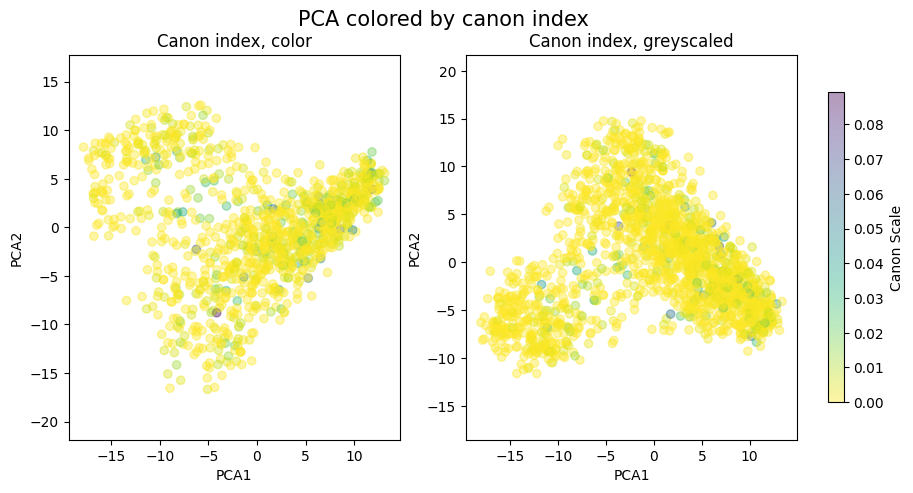

In [612]:
# PCA plots with canon scale
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

sc1 = plot_pca_scale(axs[0], color_subset, 'embedding', "canon_idx", f"Canon index, color", cmap='viridis_r')
sc2 = plot_pca_scale(axs[1], df, 'grey_embedding', "canon_idx", f"Canon index, greyscaled", cmap='viridis_r')

cbar = fig.colorbar(sc1, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)
cbar.set_label("Canon Scale")
fig.suptitle('PCA colored by canon index', size = 15, y=0.97)


## Dendrograms

#### Exhibition canon (Exhibited or not)

In [613]:
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle

In [614]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_distances
from scipy.cluster.hierarchy import linkage
from matplotlib.patches import Patch

def plot_bar_dendrogram(df, col_to_color, embedding_col, l, h, title):
    
    # define colors for 'other' and 'canon' category
    color_dict = {'other': '#129525', 'canon': '#356177'}

    # map colors to canon variable
    col_colors = df[col_to_color].map(color_dict).to_numpy()

    # Prepare embeddings and distances
    embeddings_matrix = np.stack(df[embedding_col].values)
    cosine_dist_matrix = cosine_distances(embeddings_matrix)

    if cosine_dist_matrix.shape[0] != cosine_dist_matrix.shape[1]:
        raise ValueError("Distance matrix is not square.")

    # calculate linkage matrix for hiearchical clustering of painting embeddings
    Z = linkage(cosine_dist_matrix, method='ward')

    # create dendrogram
    # we are using seaborn to plot the colors as a bar
    # seaborn does however plot their dendrograms vertically, so we need to transpose the matrix and color by columns to plot horizontally 
    sns.set_theme(color_codes=True)

    g = sns.clustermap(
        embeddings_matrix.T, # transpose matrix so it's now (dimensions, paintings)
        col_colors=col_colors, # color by columns (i.e., canon category for painting)
        row_cluster=False,               
        col_linkage=Z, # use custom linkage matrix
        dendrogram_ratio=(0.01, 0.9), 
        colors_ratio=0.04,
        figsize=(l, h)
    )

    # remove heatmap (it's just a binary variable so not much information here)
    g.ax_heatmap.remove()
    g.cax.remove()

    # add legend
    handles = [Patch(color=color_dict[key], label=key) for key in color_dict]
    g.ax_col_dendrogram.legend(
        handles=handles,
        loc = 'upper right',
        fontsize = '10',
        facecolor = 'none', # remove grey background from legend box
        title= 'Canon label'
    )

    # adjust layot of plot
    plt.subplots_adjust(top=0.98, bottom=0.15, left=0.05, right=0.95, hspace=0.05)

    # axes are a bit messed up so I'm just adding a y axis manually using a text box
    g.fig.text(0.02, 0.6, "Cosine Distance", va='center', rotation='vertical', fontsize=12)
    
    # add title
    g.fig.suptitle(title, y=1, fontsize=16)

    plt.show()

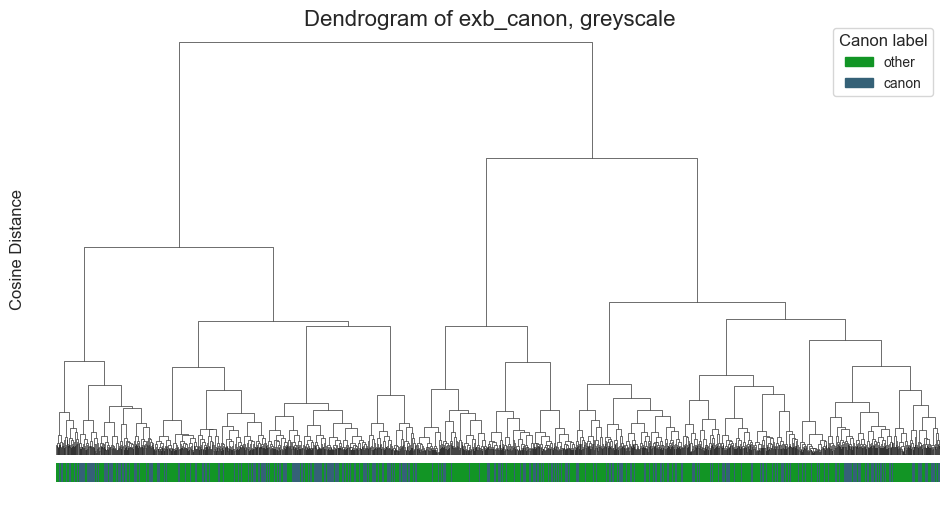

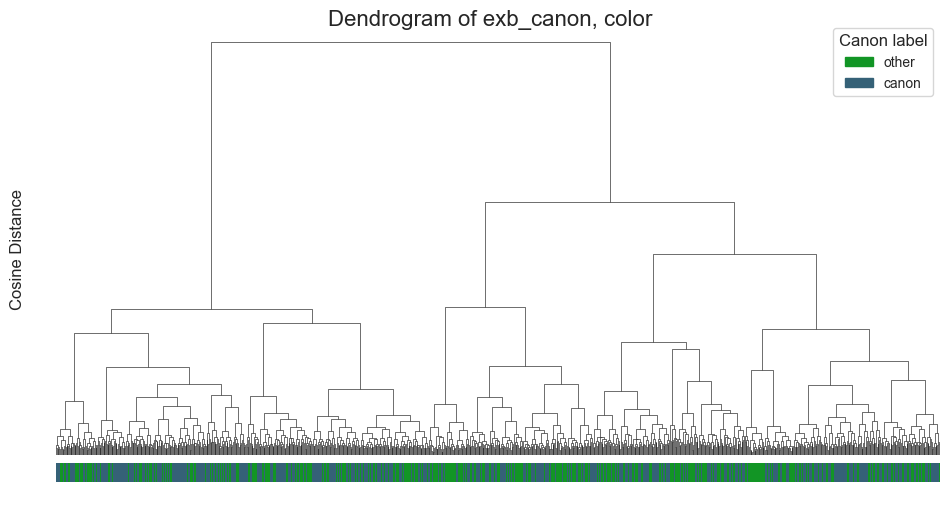

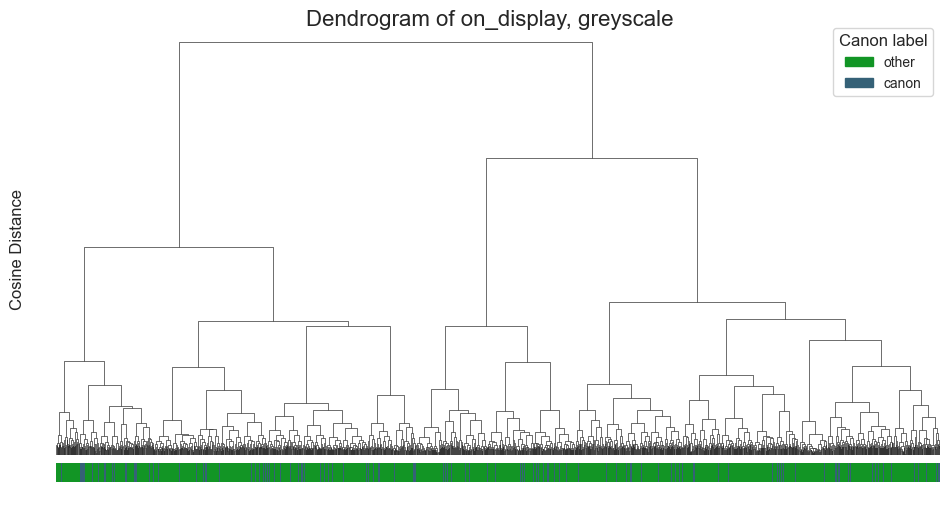

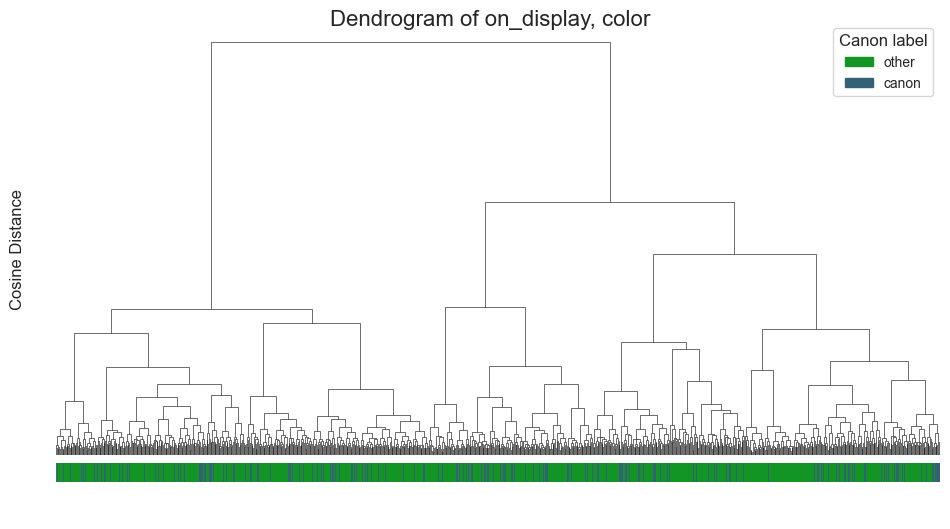

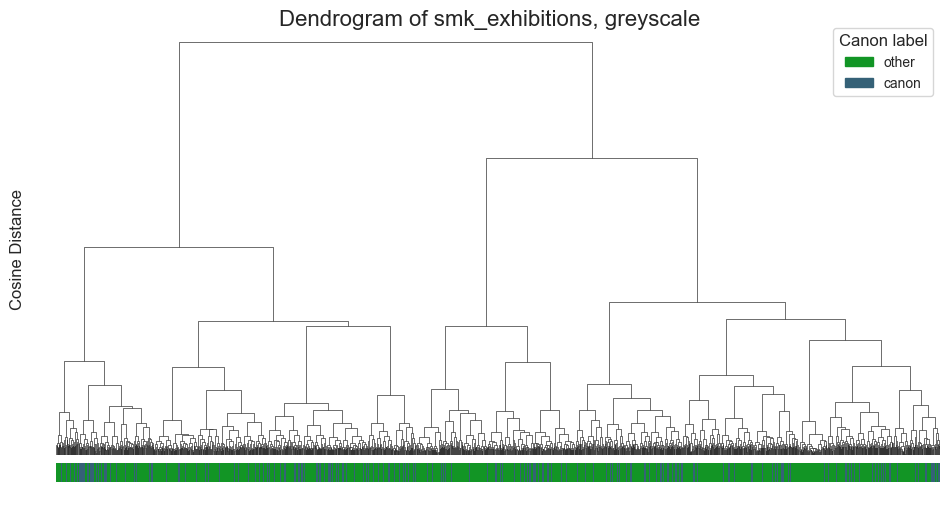

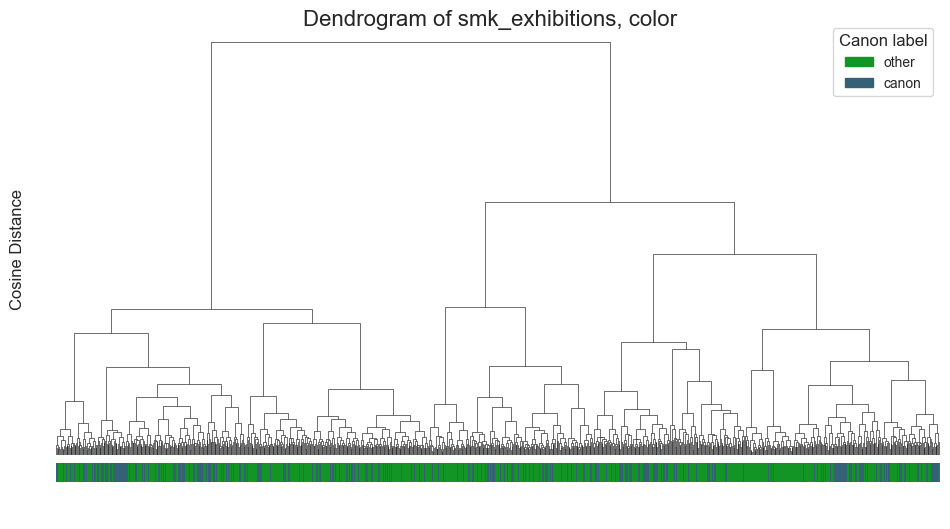

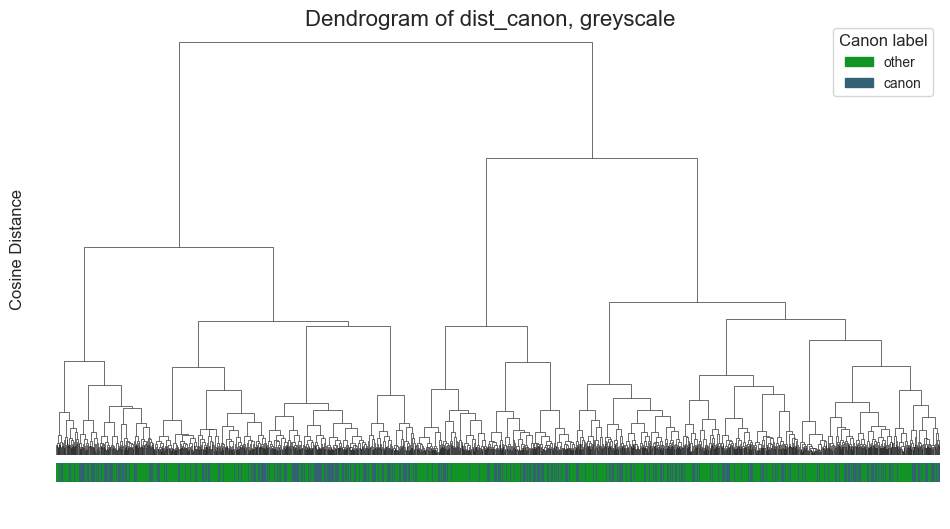

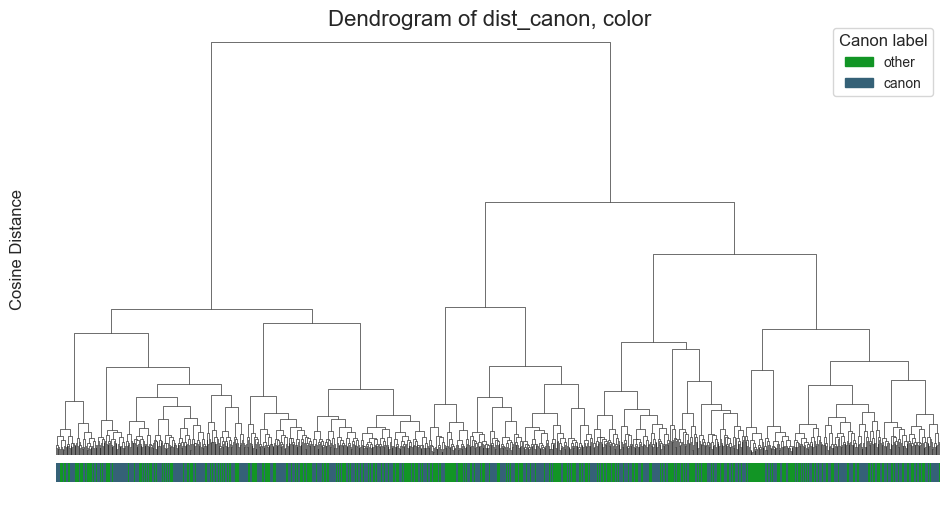

In [615]:
canon_cols = ['exb_canon', 'on_display', 'smk_exhibitions', 'dist_canon']

for col in canon_cols:

    # plot greyscale
    plot_bar_dendrogram(df, col, 'grey_embedding', 10, 6, f'Dendrogram of {col}, greyscale')

    # plot color
    plot_bar_dendrogram(color_subset, col, 'embedding', 10, 6, f'Dendrogram of {col}, color')

# Measuring diachronic change

#### Naive approach (no up or downsampling)

In [13]:
def get_cosim_mean_std(groups_dict, embedding_col, key):

    '''
    Calculate mean and SD cosine similarity for embedding column of dataset in groups_dict
    '''

    data = groups_dict[key]
    embeddings = np.stack(data[embedding_col].values)
    mean_cosim = cosine_similarity(embeddings).mean()
    std_cosim = cosine_similarity(embeddings).std()
    
    return mean_cosim, std_cosim

In [14]:
def create_groups(df, year_col, canon_col, year_range):

    '''
    Create dict with groups of canon, non-canon and total paintings in specified time window
    '''
    
    canon = df.loc[(df[year_col].isin(year_range)) & (df[canon_col] == 'canon')]
    df_total = df.loc[df[year_col].isin(year_range)]
    non_canon = df.loc[(df[year_col].isin(year_range)) & (df[canon_col] == 'other')]

     # create dict
    groups = {'canon': canon, 'df_total': df_total, 'non_canon': non_canon}

    return groups

In [15]:
def get_all_cosims(df, year_col, canon_col, year_range, embedding_col, sampling, sample_size, run):

    '''
    Calculate all cosine similarity measures for current time window and return as dict. 

    First creates groups of canon, non-canon and total paintings in the current time window.
    Next, it calculates the mean cosine similarity of the embeddings in the current window for each group.
    The cosine similarity between the mean canon and non-canon embeddings is also calculated.
    '''

    groups = create_groups(df, year_col, canon_col, year_range)

    if sampling == True:
        for key in groups:
            group = groups[key]
            groups[key] = group.sample(sample_size, random_state=run) if len(group) > sample_size else group

    # get the mean embeddings of the current window for each group
    canon_mean = groups['canon'][embedding_col].mean(axis=0)
    non_canon_mean = groups['non_canon'][embedding_col].mean(axis=0)

    temp = {} 

    # get the mean cosine similarity between mean canon embedding and mean non-canon embedding for this time window
    
    #canon_noncanon_similarity = cosine_similarity(np.stack([non_canon_mean, canon_mean])).mean()
    canon_noncanon_similarity = cosine_similarity(np.stack([non_canon_mean, canon_mean]))[0][1]
    temp['CANON_NONCANON_COSIM'] = canon_noncanon_similarity

    # get mean cosine similarity of canon embeddings for this time window
    canon_mean, canon_std = get_cosim_mean_std(groups, embedding_col, 'canon')
    temp['CANON_COSIM_MEAN'] = canon_mean 
    temp['CANON_COSIM_STD'] = canon_std

    # get mean cosine similarity of non-canon embeddings for this time window
    nc_mean, nc_std = get_cosim_mean_std(groups, embedding_col, 'non_canon')
    temp['NONCANON_COSIM_MEAN'] = nc_mean
    temp['NONCANON_COSIM_STD'] = nc_std

    # get mean cosine similarity of all data for this time window
    t_mean, t_std = get_cosim_mean_std(groups, embedding_col, 'df_total')
    temp['TOTAL_COSIM_MEAN'] = t_mean
    temp['TOTAL_COSIM_STD'] = t_std

    temp['n_paintings'] = [len(groups['df_total']), len(groups['canon']), len(groups['non_canon'])]
    
    return temp


In [8]:
# sampling 

# intra-group
def simulate_cosim_mean_std(groups, key, embedding_col, num_simulations, sim_type='gaussian'):
        
        # get data for canon group
        data = groups[key]
        
        if len(data) > 1:

            embeddings = np.stack(data[embedding_col].values)
            cosim_matrix = cosine_similarity(embeddings)

            # exclude the diagonal of the matrix
            cosim_values = cosim_matrix[np.triu_indices_from(cosim_matrix, k=1)]


            if sim_type == 'gaussian':
                simulated_means = []

                for _ in range(num_simulations):

                    # Simulate data from a normal distribution based on the sample mean and std
                    simulated_data = np.random.normal(cosim_values.mean(), cosim_values.std(), len(cosim_values))
                    simulated_means.append(simulated_data.mean())

                # return the mean of the simulated means as the 'overall' cosim mean for this time window and group
                return np.mean(simulated_means), np.std(simulated_means)
            
            elif sim_type == 'bootstrap':
                bootstrap_means = []
                for _ in range(num_simulations):

                    # Generate a bootstrap sample (randomly sample from cosim_values) with replacement (each value can appear multiple times)
                    bootstrap_sample = resample(cosim_values)
                    
                    # Calculate the mean of the bootstrap sample
                    bootstrap_mean = np.mean(bootstrap_sample)

                    bootstrap_means.append(bootstrap_mean)

                return np.mean(bootstrap_means), np.std(bootstrap_means)
            
            else:
                print('simulation type not defined')
        else:
            return np.nan, np.nan

In [9]:
# INTERGROUP

def simulate_cosim_between_groups(df, key1, key2, num_simulations, sim_type='gaussian'):
    
    # Get embeddings for each group (canon vs non canon)
    data1 = df[key1]
    data2 = df[key2]
    
    if len(data1) > 1 and len(data2) > 1:
        embeddings1 = np.stack(data1['embedding'].values)
        embeddings2 = np.stack(data2['embedding'].values)

        mean_emb1_list = []
        mean_emb2_list = []

        if sim_type == 'gaussian':
            for _ in range(num_simulations):

                # Simulate embeddings from normal distribution based on mean and std of embeddings
                simulated_embedding1 = np.random.normal(embeddings1.mean(), embeddings1.std(), embeddings1.shape)
                simulated_embedding2 = np.random.normal(embeddings2.mean(), embeddings2.std(), embeddings2.shape)
                
                # Calculate mean embedding from each simulation
                mean_embedding1 = np.mean(simulated_embedding1, axis=0)
                mean_embedding2 = np.mean(simulated_embedding2, axis=0)

                # mean embedding 1 and 2
                mean_emb1_list.append(mean_embedding1)
                mean_emb2_list.append(mean_embedding2)
            
            # get overall mean of all simulation runs for each group
            # so i get two means
            overall_mean1 = np.mean(mean_emb1_list, axis=0)
            overall_mean2 = np.mean(mean_emb2_list, axis=0)

            # # Calculate cosine similarity between the mean embeddings
            similarity = cosine_similarity([overall_mean1], [overall_mean2])

            return similarity
        
        elif sim_type == 'bootstrap':
            for _ in range(num_simulations):
                # Sample with replacement from both groups independently
                bootstrap_sample1 = resample(embeddings1)
                bootstrap_sample2 = resample(embeddings2)
                
                # Calculate mean embeddings for each bootstrap sample
                mean_embedding1 = np.mean(bootstrap_sample1, axis=0)
                mean_embedding2 = np.mean(bootstrap_sample2, axis=0)

                # mean embedding 1 and 2
                mean_emb1_list.append(mean_embedding1)
                mean_emb2_list.append(mean_embedding2)
            
            # get overall mean of all simulation runs for each group
            # so i get two means
            overall_mean1 = np.mean(mean_emb1_list, axis=0)
            overall_mean2 = np.mean(mean_emb2_list, axis=0)

            # # Calculate cosine similarity between the mean embeddings
            similarity = cosine_similarity([overall_mean1], [overall_mean2])

            return similarity
        
        else:
            print('simulation type not defined')
    else:
        return np.nan 

In [10]:
def simulate_all_cosims(df, year_col, canon_col, year_range, embedding_col, sampling, sample_size, run, num_simulations, sim_type):

    '''
    Calculate all cosine similarity measures for current time window and return as dict. 

    First creates groups of canon, non-canon and total paintings in the current time window.
    Next, it calculates the mean cosine similarity of the embeddings in the current window for each group.
    The cosine similarity between the mean canon and non-canon embeddings is also calculated.
    '''

    groups = create_groups(df, year_col, canon_col, year_range)

    if sampling == True:
        for key in groups:
            group = groups[key]
            groups[key] = group.sample(sample_size, random_state=run) if len(group) > sample_size else group

    temp = {} 

    canon_mean, canon_std = simulate_cosim_mean_std(groups, 'canon', embedding_col, num_simulations, sim_type)
    temp['CANON_COSIM_MEAN'] = canon_mean 
    temp['CANON_COSIM_STD'] = canon_std

    # get mean cosine similarity of non-canon embeddings for this time window
    nc_mean, nc_std = simulate_cosim_mean_std(groups, 'non_canon', embedding_col, num_simulations, sim_type)
    temp['NONCANON_COSIM_MEAN'] = nc_mean
    temp['NONCANON_COSIM_STD'] = nc_std

    # get mean cosine similarity of all data for this time window
    t_mean, t_std = simulate_cosim_mean_std(groups, 'df_total', embedding_col, num_simulations, sim_type)
    temp['TOTAL_COSIM_MEAN'] = t_mean
    temp['TOTAL_COSIM_STD'] = t_std

    # get the mean cosine similarity between mean canon embedding and mean non-canon embedding for this time window
    #canon_noncanon_similarity = cosine_similarity(np.stack([non_canon_mean, canon_mean])).mean()
    #canon_noncanon_similarity = cosine_similarity(np.stack([non_canon_mean, canon_mean]))[0][1]
    #temp['CANON_NONCANON_COSIM'] = canon_noncanon_similarity

    # Intergroup similarity calculations
    mean_similarity_c_nc = simulate_cosim_between_groups(groups, 'canon', 'non_canon', num_simulations, sim_type)
    temp['CANON_NONCANON_COSIM'] = mean_similarity_c_nc


    temp['n_paintings'] = [len(groups['df_total']), len(groups['canon']), len(groups['non_canon'])]
    
    return temp

In [16]:
def run_change_analysis(w_size, df, canon_col, embedding_col, step_size=1, year_col='start_year', n_runs=1, sampling=False, sample_size=0, simulate=False, num_simulations=0, sim_type='none'):
    # raise error if w size is smaller than 5
    # Start a loop over the years
    mean_similarity_dict = {}

    # Get the minimum and maximum years in the dataset
    min_year = df[year_col].min()
    max_year = df[year_col].max()

    for run in range(n_runs):
        for start_year in range(min_year, max_year - w_size + 1, step_size):

            # Define rolling window range for each window
            year_range = list(range(start_year, start_year + w_size))
            range_label = f"{year_range[0]}-{year_range[-1]}"

            if simulate == True:
                temp = simulate_all_cosims(df, year_col, canon_col, year_range, embedding_col, sampling, sample_size, run, num_simulations, sim_type)

            else:
                temp = get_all_cosims(df, year_col, canon_col, year_range, embedding_col, sampling, sample_size, run)
            
            # add cosine similarity measure to dict for dict at time window
            mean_similarity_dict[range_label] = temp
    
    # create dataframe from dict
    sim_df = pd.DataFrame.from_dict(mean_similarity_dict, orient='index').reset_index()
    sim_df = sim_df.rename(columns={"index": "year_RANGE"})

    # add start year column
    sim_df['START_year'] = sim_df['year_RANGE'].apply(lambda x: int(x.split('-')[0]))

    # make sure there's at least 2 paintings in each group

    sim_df['n_paintings']

    part_canon_list = []

    for l in sim_df['n_paintings']:
        total = l[0]
        canon = l[1]

        part_canon = canon / total
        part_canon_list.append(part_canon)


    #print(f"mean canon part: {np.mean(part_canon_list)}, min canon part: {np.min(part_canon_list)}, max canon part: {np.max(part_canon_list)}")
    #print(sim_df['n_paintings'].apply(lambda x: min(x)).min(), "is the smallest group size in a window")

    return sim_df

In [17]:
def plot_diachronic_change(w_size, df, canon_col, embedding_col, cosim_to_plot, ax, step_size=1, year_col='start_year', n_runs=1, sampling=False, sample_size=0, simulate=False, num_simulations=0, sim_type='none', cutoff=5, color='#75BCC6'):

    plt.style.use('default')

    # get dataframe of cosine similarity for each time window for chosen canon measure 
    sim_df = run_change_analysis(
                w_size,
                df,
                canon_col,
                embedding_col,
                step_size=step_size,
                year_col=year_col,
                n_runs=n_runs,
                sampling=sampling,
                sample_size=sample_size,
                simulate=simulate,
                num_simulations=num_simulations,
                sim_type=sim_type
    )

    min_group_idx = int(sim_df['n_paintings'].explode().idxmin())
    min_group_size = min(sim_df['n_paintings'].iloc[min_group_idx])
    #min_group_year = sim_df['START_year'].iloc[min_group_idx]
    #min_group_cosim = sim_df[cosim_to_plot].iloc[min_group_idx]

    # remove first n and last n windows
    #sim_df = sim_df.iloc[cutoff:-cutoff]
    
        # get correlation between year and cosine similarity
    corr, pval = spearmanr(sim_df['START_year'], sim_df[cosim_to_plot])

    # plot change over time
    ax.plot(sim_df['START_year'], sim_df[cosim_to_plot], color=color, linewidth=2, alpha=0.7)
    #ax.plot(min_group_year, min_group_cosim, marker='x', color='red', markersize=5, label='Minimum group size')

    if pval < 0.01:
        greater_dir = '<'
    else:
        greater_dir = '>'

    col_or_grey = 'colored' if embedding_col == 'embedding' else 'greyscaled'

    ylabel = 'Mean Cosine Similarity'

    if cosim_to_plot == 'CANON_NONCANON_COSIM':
        ax.set_title(f'{canon_col} vs non-canon, {col_or_grey}, small. grp. = {min_group_size}')
        ylabel = 'Cosine Similarity'

    elif cosim_to_plot == 'TOTAL_COSIM_MEAN':
        ax.set_title(f'Total data, {col_or_grey}, small. grp. = {min_group_size}')

    else:
        ax.set_title(f'{canon_col}, {col_or_grey}, small. grp. = {min_group_size}')

    # create plot
    ax.set_xlabel(year_col)
    ax.set_ylabel(ylabel)
    #ax.legend(fontsize=8)

    #ax.set_xlim(sim_df['START_year'].iloc[0], sim_df['START_year'].iloc[-1])
    #props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    # place a text box in upper right in axes coords
    ax.text(0.5, 0.95, f"r = {round(corr, 2)}, p{greater_dir}0.1", transform=ax.transAxes, fontsize=10,
        verticalalignment='top')

Text(0.5, 0.97, 'Intra-group analysis for total data, w_size = 30')

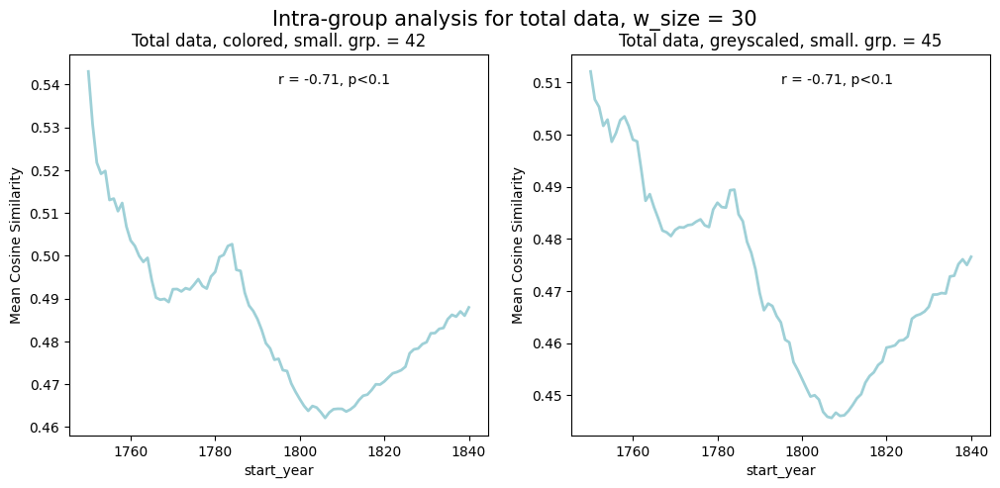

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

plot_diachronic_change(w_size = 30, 
                    df = color_subset, 
                    canon_col = 'exb_canon', 
                    embedding_col = 'embedding', 
                    cosim_to_plot = 'TOTAL_COSIM_MEAN', 
                    ax = axs[0])

plot_diachronic_change(w_size = 30, 
                df = df, 
                canon_col = 'exb_canon', 
                embedding_col = 'grey_embedding', 
                cosim_to_plot = 'TOTAL_COSIM_MEAN', 
                ax = axs[1])
                

fig.suptitle('Intra-group analysis for total data, w_size = 30', size = 15, y=0.97)

Text(0.5, 0.97, 'Intra-group analysis for total data, w_size = 10')

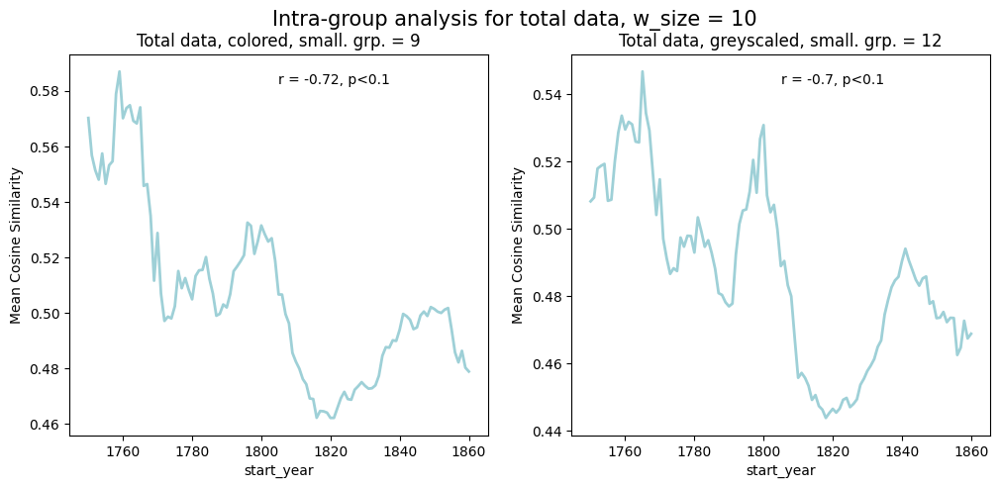

In [168]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

plot_diachronic_change(w_size = 10, 
                    df = color_subset, 
                    canon_col = 'exb_canon', 
                    embedding_col = 'embedding', 
                    cosim_to_plot = 'TOTAL_COSIM_MEAN', 
                    ax = axs[0])

plot_diachronic_change(w_size = 10, 
                df = df, 
                canon_col = 'exb_canon', 
                embedding_col = 'grey_embedding', 
                cosim_to_plot = 'TOTAL_COSIM_MEAN', 
                ax = axs[1])

fig.suptitle('Intra-group analysis for total data, w_size = 10', size = 15, y=0.97)

In [18]:
def create_stacked_freqplot(df, ax, canon_col, w_size, year_col = 'start_year'):

    groupobject = df.groupby([year_col, canon_col]).size().unstack()
    groupobject.plot(kind='bar', stacked=True, ax=ax)

    N = w_size
    ax.set_xticks(range(0, len(groupobject), N))
    ax.set_xticklabels(groupobject.index[::N])

    ax.set_title(f'{canon_col} frequency')
    ax.set_xlabel(year_col)   
    ax.set_ylabel('Number of paintings')

    #ax.legend(title='Canon status', loc='upper right')

In [19]:
def plot_grid(df, color_subset, canon_cols, w_size, cosim_to_plot, title, savefig, filename):

    fig, axs = plt.subplots(3, len(canon_cols), figsize=(len(canon_cols)*6, 15))

    for idx, col in enumerate(canon_cols):

        plot_diachronic_change(w_size = 30, 
                            df = color_subset, 
                            canon_col = col, 
                            embedding_col = 'embedding', 
                            cosim_to_plot = cosim_to_plot, 
                            ax = axs[0, idx])
        
        plot_diachronic_change(w_size = 30, 
                            df = df, 
                            canon_col = col, 
                            embedding_col = 'grey_embedding', 
                            cosim_to_plot = cosim_to_plot, 
                            ax = axs[1, idx])

        create_stacked_freqplot(df=df, w_size = 30, ax = axs[2, idx], canon_col=col)


    fig.suptitle(f'{title}, w_size = {w_size}', size = 20, y=0.95)

    if savefig==True:
        plt.savefig(os.path.join('..', 'figs', filename), format='png', dpi=1200)


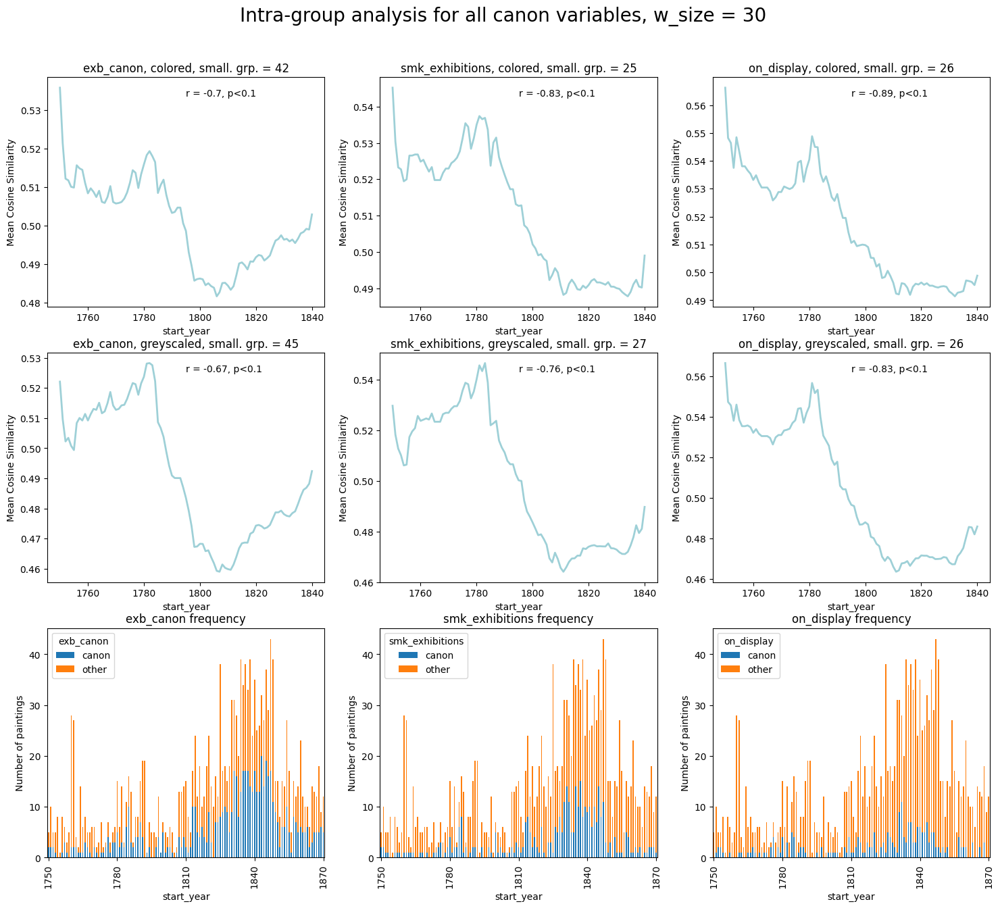

In [179]:
canon_cols = ['exb_canon', 'smk_exhibitions', 'on_display']
plot_grid(canon_cols = canon_cols,
        w_size= 30, 
        cosim_to_plot='CANON_COSIM_MEAN', 
        title='Intra-group analysis for all canon variables', 
        savefig=True,
        filename='intra_canon_w30.png')

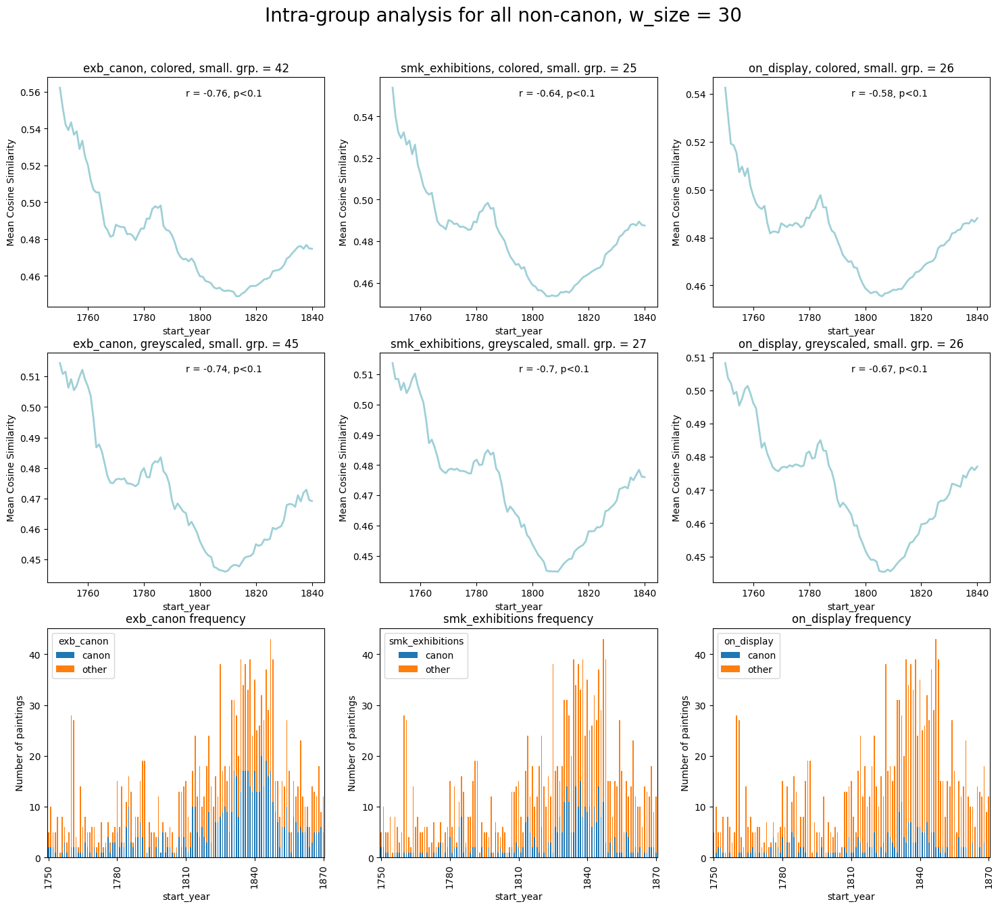

In [180]:
plot_grid(canon_cols = canon_cols,
        w_size= 30, 
        cosim_to_plot='NONCANON_COSIM_MEAN', 
        title='Intra-group analysis for all non-canon',
        savefig=True,
        filename='intra_noncanon_w30.png')

### Intragroup analysis with simulations

##### Bootstrap, w_size = 30

Text(0.5, 0.97, 'Intra-group analysis for all canon variables, 100 bootstrap simulations, w_size = 30')

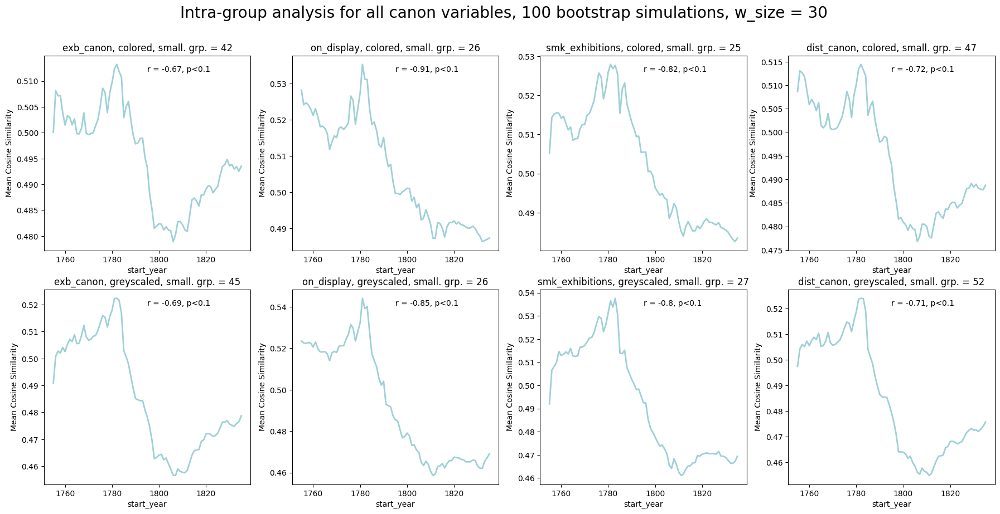

In [630]:
fig, axs = plt.subplots(2, 4, figsize=(22, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 30, 
                           df = color_subset, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_COSIM_MEAN', 
                           ax = axs[0, idx],
                           simulate=True,
                           num_simulations = 100,
                           sim_type = 'bootstrap'
                           )
    
    plot_diachronic_change(w_size = 30, 
                        df = df, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_COSIM_MEAN', 
                        ax = axs[1, idx],
                        simulate=True,
                        num_simulations = 100,
                        sim_type = 'bootstrap')

fig.suptitle('Intra-group analysis for all canon variables, 100 bootstrap simulations, w_size = 30', size = 20, y=0.97)

#### Gaussian, w_size = 30

Text(0.5, 0.97, 'Intra-group analysis for all canon variables, 100 gaussian simulations, w_size = 30')

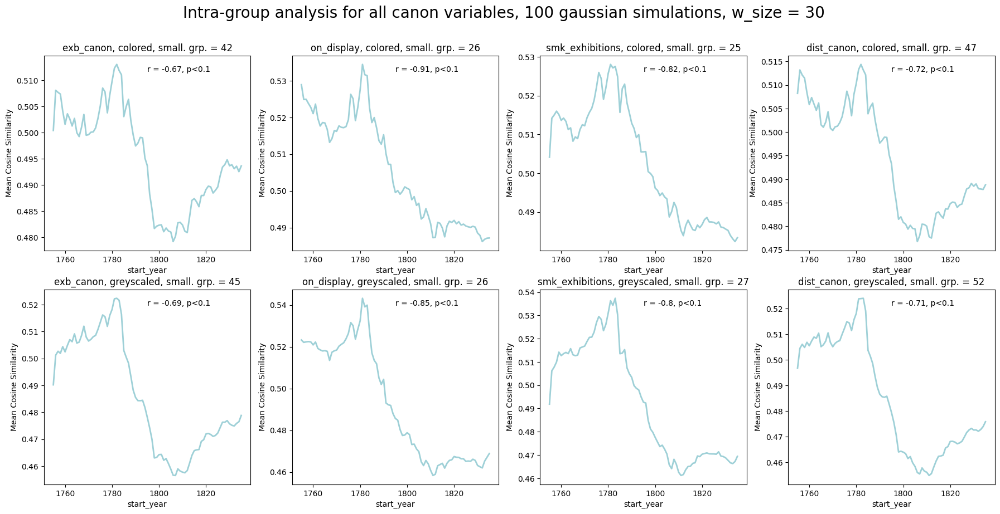

In [493]:
fig, axs = plt.subplots(2, 4, figsize=(22, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 30, 
                           df = color_subset, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_COSIM_MEAN', 
                           ax = axs[0, idx],
                           simulate=True,
                           num_simulations = 100,
                           sim_type = 'gaussian'
                           )
    
    plot_diachronic_change(w_size = 30, 
                        df = df, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_COSIM_MEAN', 
                        ax = axs[1, idx],
                        simulate=True,
                        num_simulations = 100,
                        sim_type = 'gaussian')

fig.suptitle('Intra-group analysis for all canon variables, 100 gaussian simulations, w_size = 30', size = 20, y=0.97)

## Inter-group analysis

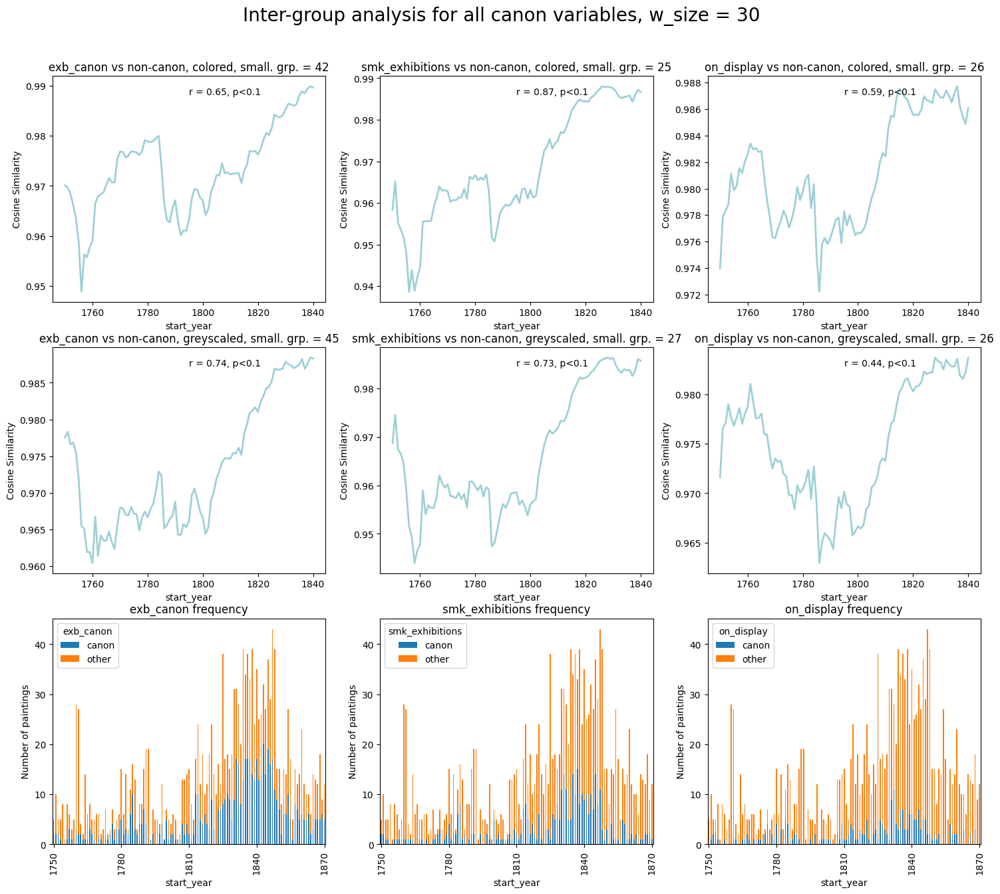

In [181]:
plot_grid(canon_cols = canon_cols,
        w_size= 30, 
        cosim_to_plot='CANON_NONCANON_COSIM', 
        title='Inter-group analysis for all canon variables',
        savefig=True,
        filename='inter_w30.png')

Text(0.5, 0.97, 'Inter-group analysis for all canon variables, w_size = 30')

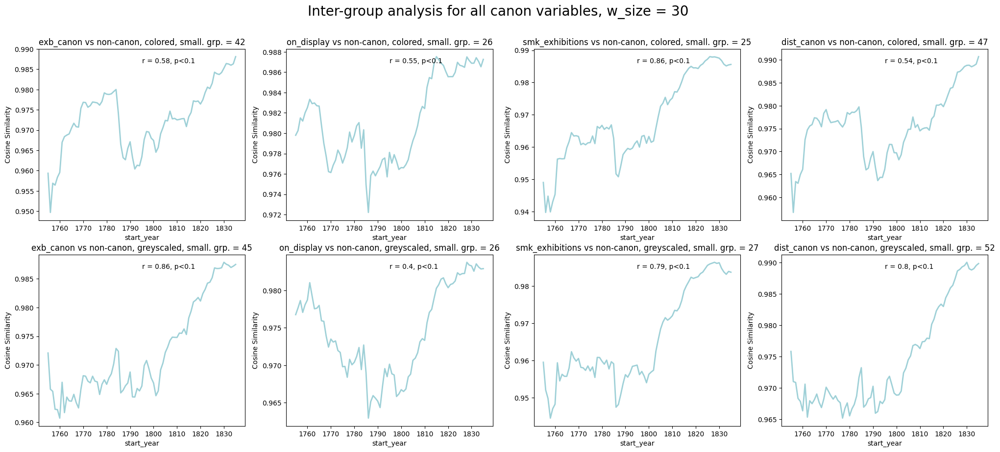

In [631]:
fig, axs = plt.subplots(2, 4, figsize=(25, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 30, 
                           df = color_subset, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_NONCANON_COSIM', 
                           ax = axs[0, idx])
    
    plot_diachronic_change(w_size = 30, 
                        df = df, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_NONCANON_COSIM', 
                        ax = axs[1, idx])

fig.suptitle('Inter-group analysis for all canon variables, w_size = 30', size = 20, y=0.97)

#### window size = 10

Text(0.5, 0.97, 'Inter-group analysis for all canon variables, w_size = 10')

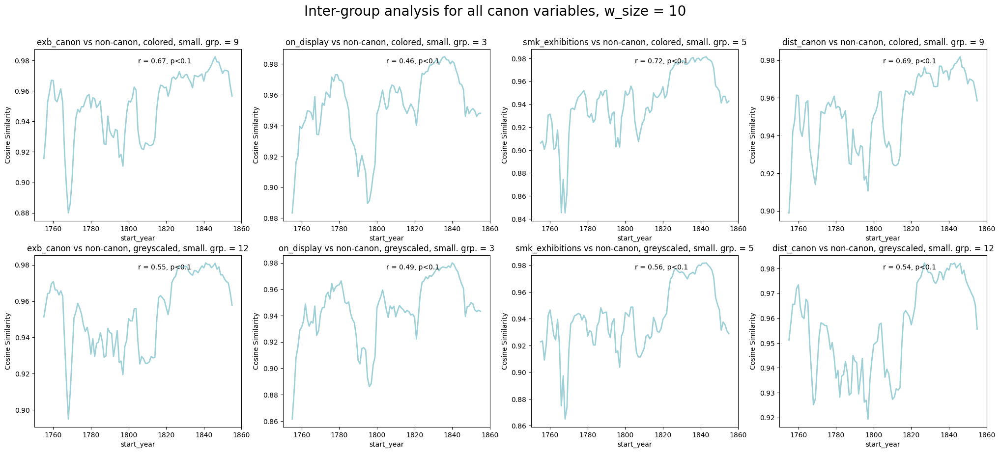

In [632]:
fig, axs = plt.subplots(2, 4, figsize=(25, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 10, 
                           df = color_subset, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_NONCANON_COSIM', 
                           ax = axs[0, idx])
    
    plot_diachronic_change(w_size = 10, 
                        df = df, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_NONCANON_COSIM', 
                        ax = axs[1, idx])

fig.suptitle('Inter-group analysis for all canon variables, w_size = 10', size = 20, y=0.97)

#### Inter-group analysis with simulations

##### Bootstrap, w_size = 30

Text(0.5, 0.97, 'Inter-group analysis for all canon variables, 100 bootstrap simulations, w_size = 30')

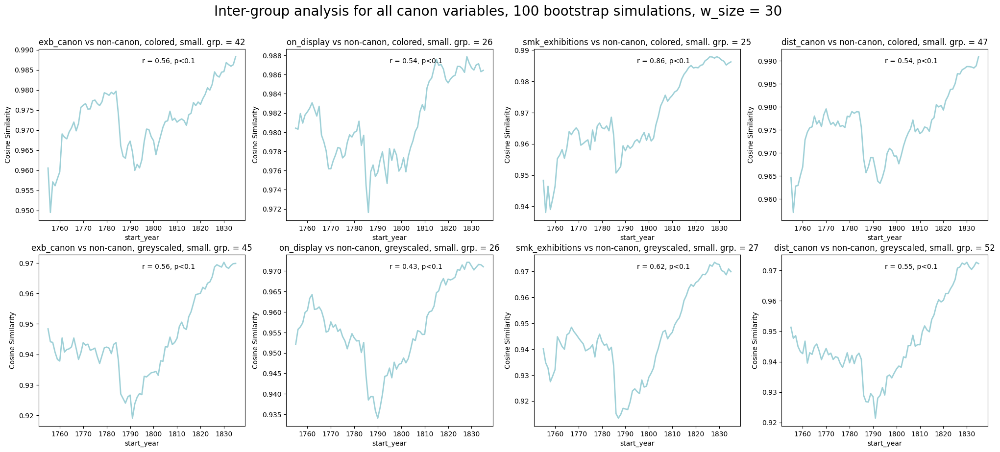

In [633]:
fig, axs = plt.subplots(2, 4, figsize=(25, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 30, 
                           df = color_subset, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_NONCANON_COSIM', 
                           ax = axs[0, idx],
                           simulate=True,
                           num_simulations = 100,
                           sim_type = 'bootstrap'
                           )
    
    plot_diachronic_change(w_size = 30, 
                        df = df, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_NONCANON_COSIM', 
                        ax = axs[1, idx],
                        simulate=True,
                        num_simulations = 100,
                        sim_type = 'bootstrap')

fig.suptitle('Inter-group analysis for all canon variables, 100 bootstrap simulations, w_size = 30', size = 20, y=0.97)

##### Gaussian, w_size = 30

Text(0.5, 0.97, 'Inter-group analysis for all canon variables, 100 gaussian simulations, w_size = 30')

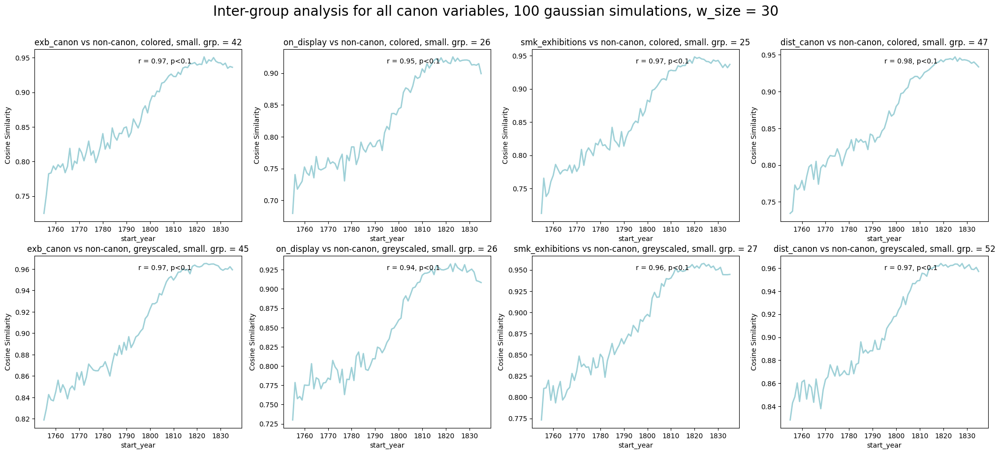

In [497]:
fig, axs = plt.subplots(2, 4, figsize=(25, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 30, 
                           df = color_subset, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_NONCANON_COSIM', 
                           ax = axs[0, idx],
                           simulate=True,
                           num_simulations = 100,
                           sim_type = 'gaussian'
                           )
    
    plot_diachronic_change(w_size = 30, 
                        df = df, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_NONCANON_COSIM', 
                        ax = axs[1, idx],
                        simulate=True,
                        num_simulations = 100,
                        sim_type = 'gaussian')

fig.suptitle('Inter-group analysis for all canon variables, 100 gaussian simulations, w_size = 30', size = 20, y=0.97)

### Intra & Intergroup with mean_production_year, w_size = 30

In [634]:
df_removed = df.query('mean_prod_year <= 1870')
color_subset_removed = color_subset.query('mean_prod_year <= 1870')

Text(0.5, 0.97, 'Intra-group analysis for all canon variables using mean_prod_year, w_size = 30')

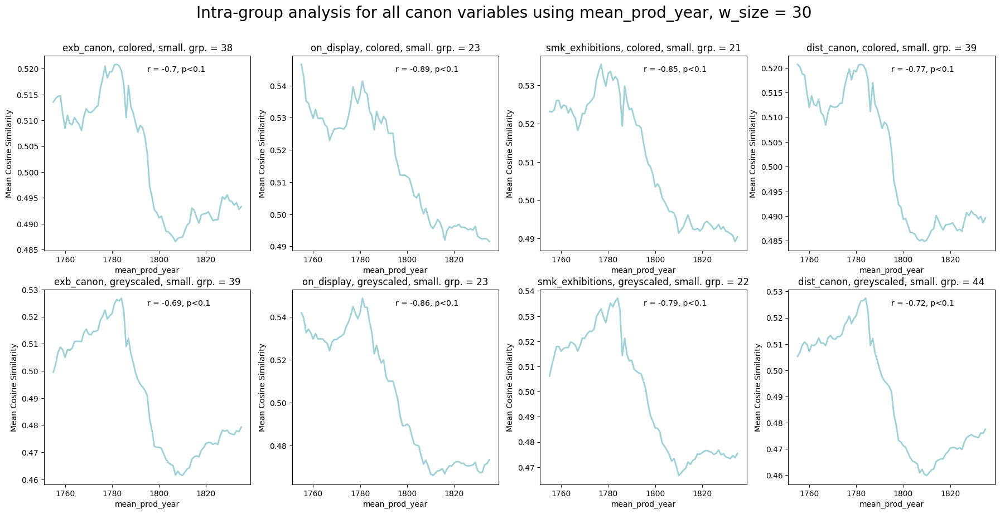

In [635]:
fig, axs = plt.subplots(2, 4, figsize=(22, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 30, 
                           df = color_subset_removed, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_COSIM_MEAN', 
                           ax = axs[0, idx],
                           year_col = 'mean_prod_year')
    
    plot_diachronic_change(w_size = 30, 
                        df = df_removed, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_COSIM_MEAN', 
                        ax = axs[1, idx],
                        year_col = 'mean_prod_year')

fig.suptitle('Intra-group analysis for all canon variables using mean_prod_year, w_size = 30', size = 20, y=0.97)

Text(0.5, 0.97, 'Inter-group analysis for all canon variables using mean_prod_year, w_size = 30')

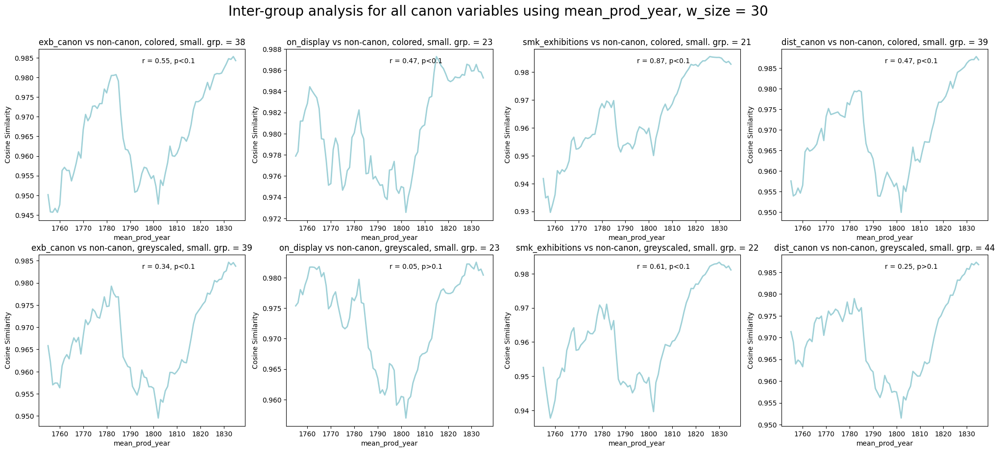

In [502]:
fig, axs = plt.subplots(2, 4, figsize=(25, 10))

for idx, col in enumerate(canon_cols):

    plot_diachronic_change(w_size = 30, 
                           df = color_subset_removed, 
                           canon_col = col, 
                           embedding_col = 'embedding', 
                           cosim_to_plot = 'CANON_NONCANON_COSIM', 
                           ax = axs[0, idx],
                           year_col = 'mean_prod_year')
    
    plot_diachronic_change(w_size = 30, 
                        df = df_removed, 
                        canon_col = col, 
                        embedding_col = 'grey_embedding', 
                        cosim_to_plot = 'CANON_NONCANON_COSIM', 
                        ax = axs[1, idx],
                        year_col = 'mean_prod_year')

fig.suptitle('Inter-group analysis for all canon variables using mean_prod_year, w_size = 30', size = 20, y=0.97)

## Entropy / change detection

In [20]:
def calc_signals(df, w_size, embedding_col, year_col):
    '''
    Calculate novelty, transience and resonance signals from image embeddings
    '''
    # convert embedding to array
    X = np.array(df[embedding_col])

    # convert array to probability distributions and back to array
    X_prob = [calc_vector_histogram(vect, bins=256) for vect in X]
    X_prob = np.array(X_prob)

    # calculate signal
    w_main = WindowedRollingDistance(
        measure='jensenshannon',
        window_size=w_size,
        estimate_error=True)

    signal = w_main.fit_transform(X_prob)

    # convert to dataframe
    signal_df = pd.DataFrame(signal)

    # add information about production year
    signal_df['year'] = df[year_col]

    return signal_df

In [21]:
def plot_canon_novelty(df, canon_noncanon, canon_col, embedding_col, w_size, year_col, col_or_grey, ax):
    
    # define canon df based on chosen canon variable

    if canon_noncanon == 'total':
        df_canon = df

    elif canon_noncanon == 'non_canon':
        df_canon = df[df[canon_col] == 'other']

    else:
        df_canon = df[df[canon_col] == 'canon']

    # sort by start year, lowest to highest
    df_canon_sorted = df_canon.sort_values(by=year_col).reset_index(drop=True)

    # calculate novelty and resonance signals (windowed rolling distance function
    signal_df = calc_signals(df_canon_sorted, w_size, embedding_col, year_col)

    # exclude the first w_size rows as they are empty
    n_df = signal_df.iloc[w_size:, :]
    n_hat = n_df['N_hat'].tolist() # get novelty signal
    n_years = n_df['year'].tolist() # get year

    # plot raw novelty signal as well as smoothed signal with a gaussian filter
    ax.plot(n_years, n_hat, alpha=0.5)
    ax.plot(n_years, gaussian_filter1d(n_hat, 5), label='Novelty (Gaussian filter, sigma = 5)', color='blue')
    ax.set_ylabel(f'Average windowed Jensen-Shannon Distance (w={w_size})')
    ax.set_xlabel(year_col)
    ax.set_title(f'{canon_col}, {col_or_grey}, w_size = {w_size}')
    ax.legend(loc='upper right')


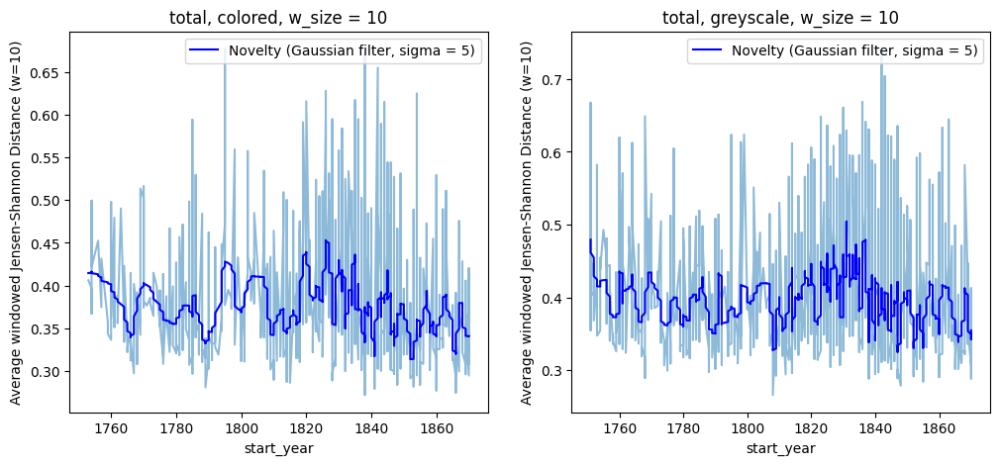

In [7]:
# total signal
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
plot_canon_novelty(color_subset, 'total', 'embedding', 10, 'start_year', 'colored', axs[0])
plot_canon_novelty(df, 'total', 'grey_embedding', 10, 'start_year', 'greyscale', axs[1])

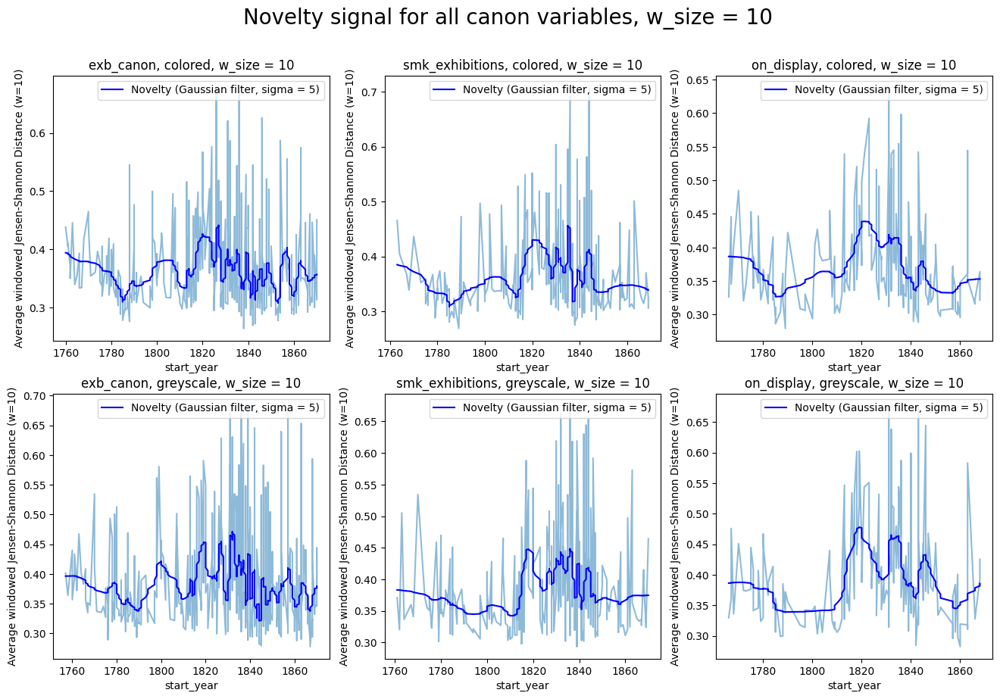

In [185]:
fig, axs = plt.subplots(2, 3, figsize=(16, 10))

for idx, col in enumerate(canon_cols):
    plot_canon_novelty(df = color_subset, 
                       canon_col = col, 
                       embedding_col = 'embedding', 
                       w_size = 10, 
                       year_col = 'start_year', 
                       col_or_grey = 'colored', 
                       ax = axs[0,idx])

    plot_canon_novelty(df = df,
                       canon_col = col,
                        embedding_col = 'grey_embedding', 
                        w_size = 10,
                        year_col = 'start_year', 
                        col_or_grey= 'greyscale', 
                        ax = axs[1,idx])

fig.suptitle('Novelty signal for all canon variables, w_size = 10', size = 20, y=0.97)

plt.savefig(os.path.join('..', 'figs', 'novelty_canons_w10.png'), format='png')

#### Entropy measures using mean production year

Text(0.5, 0.99, 'Novelty signal for all paintings, w_size = 10, using mean prod year')

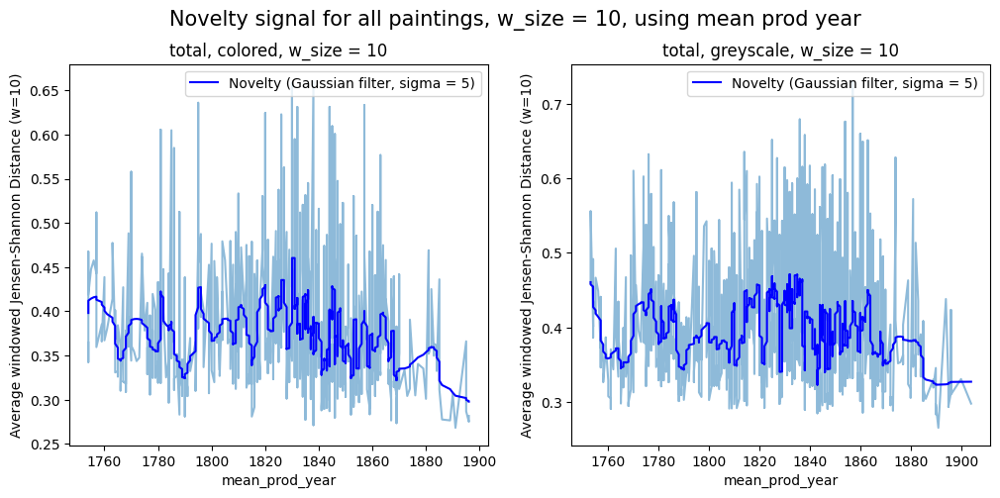

In [640]:
# total signal
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
plot_canon_novelty(color_subset, 'total', 'embedding', 10, 'mean_prod_year', 'colored', axs[0])
plot_canon_novelty(df, 'total', 'grey_embedding', 10, 'mean_prod_year', 'greyscale', axs[1])

fig.suptitle('Novelty signal for all paintings, w_size = 10, using mean prod year', size = 15, y=0.99)

Text(0.5, 0.97, 'Novelty signal for all canon variables, w_size = 10, using mean prod year')

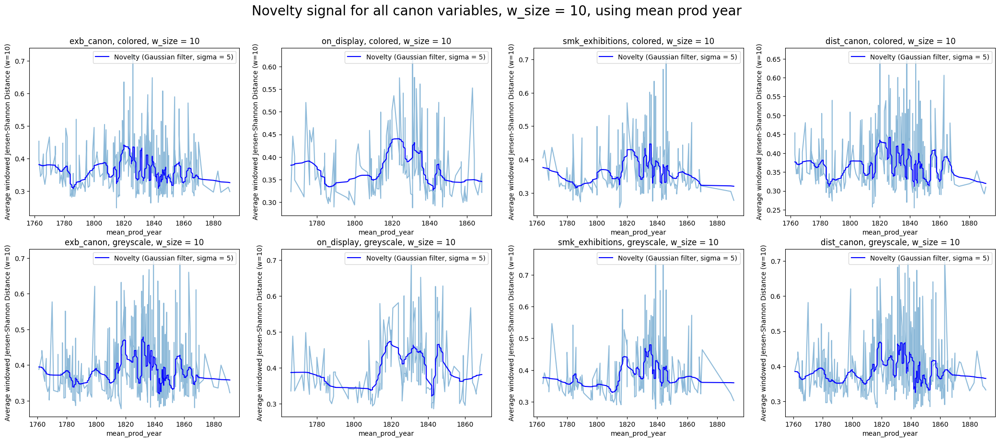

In [641]:
fig, axs = plt.subplots(2, 4, figsize=(26, 10))

for idx, col in enumerate(canon_cols):
    plot_canon_novelty(df = color_subset, 
                       canon_col = col, 
                       embedding_col = 'embedding', 
                       w_size = 10, 
                       year_col = 'mean_prod_year', 
                       col_or_grey = 'colored', 
                       ax = axs[0, idx])

    plot_canon_novelty(df = df,
                       canon_col = col,
                        embedding_col = 'grey_embedding', 
                        w_size = 10,
                        year_col = 'mean_prod_year', 
                        col_or_grey= 'greyscale', 
                        ax = axs[1, idx])

fig.suptitle('Novelty signal for all canon variables, w_size = 10, using mean prod year', size = 20, y=0.97)

#### W_size as years

In [22]:
def plot_canon_novelty(df, canon_noncanon, canon_col, embedding_col, w_size, year_col, col_or_grey, ax):
    
    # define canon df based on chosen canon variable

    if canon_noncanon == 'total':
        df_canon = df

    elif canon_noncanon == 'non_canon':
        df_canon = df[df[canon_col] == 'other']

    else:
        df_canon = df[df[canon_col] == 'canon']

    # calculate mean embedding per year
    start_years = df_canon['start_year'].sort_values().unique().tolist()

    mean_embeddings = []
    
    for year in start_years:
        year_df = df.query(f"start_year == {year}")
        mean_embedding = year_df[embedding_col].mean()
        mean_embeddings.append(mean_embedding)
    
    data = {'start_year': start_years,
            'embedding': mean_embeddings}

    mean_embedding_df = pd.DataFrame(data)

    signal_df = calc_signals(mean_embedding_df, w_size, 'embedding', 'start_year')
    # sort by start year, lowest to highest
    #df_canon_sorted = df_canon.sort_values(by=year_col).reset_index(drop=True)

    # calculate novelty and resonance signals (windowed rolling distance function
    #signal_df = calc_signals(df_canon_sorted, w_size, embedding_col, year_col)

    # exclude the first w_size rows as they are empty
    n_df = signal_df.iloc[w_size:, :]
    n_hat = n_df['N_hat'].tolist() # get novelty signal
    n_years = n_df['year'].tolist() # get year

    # plot raw novelty signal as well as smoothed signal with a gaussian filter
    ax.plot(n_years, n_hat, alpha=0.5)
    ax.plot(n_years, gaussian_filter1d(n_hat, 5), label='Novelty (Gaussian filter, sigma = 5)', color='blue')
    ax.set_ylabel(f'Average windowed Jensen-Shannon Distance (w={w_size})')
    ax.set_xlabel(year_col)
    ax.set_title(f'{canon_col}, {col_or_grey}, w_size = {w_size}')
    ax.legend(loc='upper right')

In [23]:
def mean_embedding_per_year(df, embedding_col, w_size):
    
    start_years = df['start_year'].sort_values().unique().tolist()

    mean_embeddings = []
    
    for year in start_years:
        year_df = df.query(f"start_year == {year}")
        mean_embedding = year_df[embedding_col].mean()
        mean_embeddings.append(mean_embedding)
    
    data = {'start_year': start_years,
            'embedding': mean_embeddings}

    mean_embedding_df = pd.DataFrame(data)

    signal_df = calc_signals(mean_embedding_df, w_size, 'embedding', 'start_year')

    return mean_embedding_df

In [318]:
mean_embedding_df_greyscale = mean_embedding_per_year(df, 'grey_embedding', 10)
mean_embedding_df_color = mean_embedding_per_year(color_subset, 'embedding', 10)

Text(0.5, 0.97, 'Novelty signal for total data with mean embedding per year (all data)')

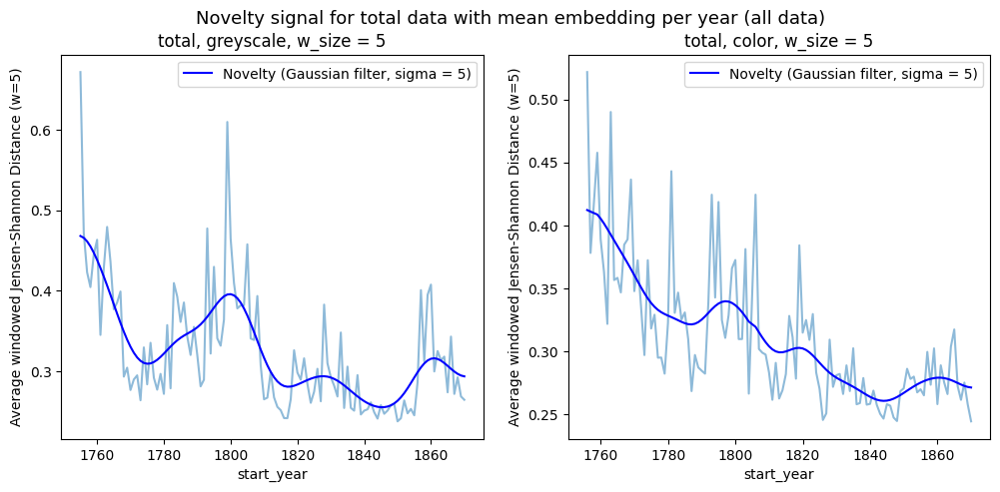

In [322]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
plot_canon_novelty(mean_embedding_df_greyscale, 'total', 'embedding', 5, 'start_year', 'greyscale', axs[0])
plot_canon_novelty(mean_embedding_df_color, 'total', 'embedding', 5, 'start_year', 'color', axs[1])
fig.suptitle('Novelty signal for total data with mean embedding per year (all data)', size = 13, y=0.97)
#plt.savefig(os.path.join('..', 'figs', 'novelty_w=mean_embed_year_w10.png'), format='png')

Text(0.5, 0.97, 'Novelty signal for all canon variables, w_size = 5')

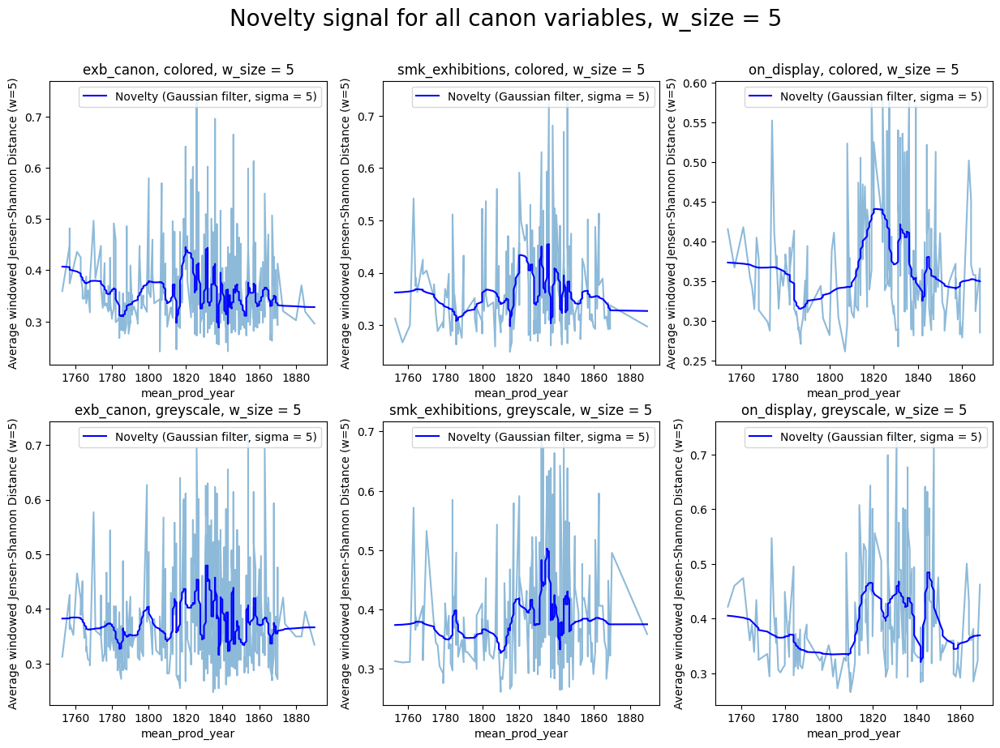

In [321]:
# create for canon variables
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

for idx, col in enumerate(canon_cols):
    plot_canon_novelty(df = color_subset, 
                       canon_col = col, 
                       embedding_col = 'embedding', 
                       w_size = 5, 
                       year_col = 'mean_prod_year', 
                       col_or_grey = 'colored', 
                       ax = axs[0, idx])

    plot_canon_novelty(df = df,
                       canon_col = col,
                        embedding_col = 'grey_embedding', 
                        w_size = 5,
                        year_col = 'mean_prod_year', 
                        col_or_grey= 'greyscale', 
                        ax = axs[1, idx])

fig.suptitle('Novelty signal for all canon variables, w_size = 5', size = 20, y=0.97)

In [191]:
def calc_mean_prob_signals(df, embedding_col, w_size):

    # for each year, calculate mean probability distribution

    X = np.array(df[embedding_col])

    # convert array to probability distributions and back to array
    X_prob = [calc_vector_histogram(vect, bins=256) for vect in X]
    X_prob = np.array(X_prob)

    X_prob_list = [np.array(i) for i in X_prob]
    df['prob'] = X_prob_list

    start_years = df['start_year'].sort_values().unique().tolist()

    mean_probs = []

    for year in start_years:
        year_df = df.query(f"start_year == {year}")
        mean_prob = year_df['prob'].mean()
        mean_probs.append(mean_prob)
    
    data = {'start_year': start_years,
            'prob': mean_probs}

    mean_embedding_df = pd.DataFrame(data)

    #X_prob = np.array(mean_embedding_df['prob'])
    #print(X_prob.shape)      # -> (N, 256)
    #print(X_prob[0].shape)
    X_prob = np.stack(mean_embedding_df['prob'].values)
    
    w_main = WindowedRollingDistance(measure='jensenshannon', window_size=w_size, estimate_error=True)

    signal = w_main.fit_transform(X_prob)

    # convert to dataframe
    signal_df = pd.DataFrame(signal)

    # add information about production year
    signal_df['year'] = mean_embedding_df['start_year'].values

    return signal_df

In [192]:
def plot_mean_prob_signals(df, embedding_col, w_size, ax, title):

    signal_df = calc_mean_prob_signals(df, embedding_col, w_size)

    # exclude the first w_size rows as they are empty
    n_df = signal_df.iloc[w_size:, :]
    n_hat = n_df['N_hat'].tolist() # get novelty signal
    n_years = n_df['year'].tolist() # get year

    # plot raw novelty signal as well as smoothed signal with a gaussian filter
    ax.plot(n_years, n_hat, alpha=0.5)
    ax.plot(n_years, gaussian_filter1d(n_hat, 5), label='Novelty (Gaussian filter, sigma = 5)', color='blue')
    ax.set_ylabel(f'Average windowed Jensen-Shannon Distance (w={w_size})')
    ax.set_xlabel('start_year')
    ax.set_title(title)
    ax.legend(loc='upper right')

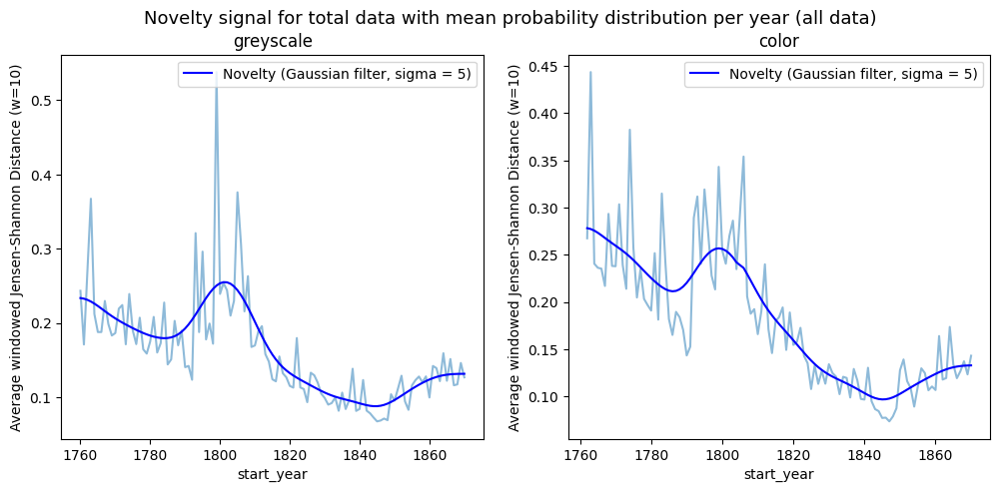

In [193]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
plot_mean_prob_signals(df, 'grey_embedding', 10, axs[0], 'greyscale')
plot_mean_prob_signals(color_subset, 'embedding', 10, axs[1], 'color')
fig.suptitle('Novelty signal for total data with mean probability distribution per year (all data)', size = 13, y=0.97)
plt.savefig(os.path.join('..', 'figs', 'novelty_w=mean_prob_year_w10.png'), format='png')

### RERUN ANALYSES WITH NEW START_DATES

In [24]:
prod_df = pd.read_csv(os.path.join(data_path, 'long_prod_periods_ingeborg.csv'), encoding='latin1')

In [25]:
prod_df.query('smk_id == "KKSgb13517"')

,Column1,period,prod_diff,prod_notes,birth_death,first_artist,smk_id,Estimated production date,Noter
140,98,1798-1854,56,"['Værkdatering: (1798-1854)', 'Udateret. Dater...",['1798-1854'],Ditlev Blunck,KKSgb13517,1828-1838,I denne periode opholder Blunck sig i Italien


In [26]:
# making some manual additions to the df (the new prod date was defined as a period)
prod_df['Estimated production date'].loc[0] = 1917
prod_df['Estimated production date'].loc[1] = 1875
prod_df['Estimated production date'].loc[130] = 1880
prod_df['Estimated production date'].loc[140] = 1833

In [ ]:
# merge / overwrite production dates in df ? 

# add new column that copies start dates, overwrite the ones with new dates, keep rest



In [ ]:
df['prod_year'] = df['start_year']

# Merge on SMK ID
df_merged = df.merge(prod_df[['smk_id', 'Estimated production date']], on='smk_id', how='left')

# Update rows is dataframe where there is a new start date
df_merged['prod_year'] = df_merged['Estimated production date'].combine_first(df_merged['prod_year'])

In [59]:
period_df = df_merged.query("prod_diff > 2")
period_nans = period_df[period_df['Estimated production date'].isna()] # for all of these, take their mean prod date instead

In [60]:
period_nans

,smk_id,period,start_year,title,first_artist,all_artists,num_artists,main_type,all_types,image_thumbnail,...,ex_years,ex_distances,smk_distances,dist_canon,canon_idx,mean_prod_year,prod_diff,prod_notes,prod_year,Estimated production date
13,KMS1560,1798-1801,1798,"Gertrud Hage, f. Heitmann",Jens Juel,[Jens Juel],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/tb09j948j_km...,...,"[2007, 2005, 1996, 2025, 2025, 2026]","[209, 207, 198, 227, 227, 228]","[<NA>, <NA>, <NA>, <NA>, <NA>, <NA>]",canon,0.012876,1799,3,[Værkdatering: Ca. 1800],1798,NaN
15,KMS8405,1820-1834,1820,Måneskin over havet,J.C. Dahl,[J.C. Dahl],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/xd07gw81q_KM...,...,"[2019, 2018]","[199, 198]","[<NA>, <NA>]",canon,0.001717,1827,14,"[Værkdatering: (Ca. 1820-35), Datering angivet...",1820,NaN
35,KMS7385,1836-1840,1836,Udsigt fra Dosseringen ved Sortedamssøen mod N...,Christen Købke,[Christen Købke],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/1831cn901_KM...,...,"[2004, 2019, 1996, 2017, 2019]","[168, 183, 160, 181, 183]","[17, 32, 9, 30, <NA>]",canon,0.008584,1838,4,"[Værkdatering: Ca. 1838, afsluttet: fagligt skøn]",1836,NaN
50,KMS3833,1830-1839,1830,Forbjerget Monte Circeo set fra omegnen af Ter...,Jørgen V. Sonne,[Jørgen V. Sonne],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/fb494c52h_km...,...,"[2019, 2005, 2021]","[189, 175, 191]","[<NA>, 77, <NA>]",canon,0.003863,1834,9,"[Værkdatering: 1830'erne, Datering baseret på ...",1830,NaN
52,KMS3439,1790-1799,1790,Hyldest til Benjamin Franklin,C.A. Lorentzen,[C.A. Lorentzen],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/r494vp29x_KM...,...,"[2019, 2021]","[229, 231]","[<NA>, <NA>]",canon,0.001717,1794,9,"[Værkdatering: (1790'erne), Dateringen er base...",1790,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1663,KMS451,1842-1845,1842,Parti af Romsdalen med Romsdals Horn og Viking...,A.W. Boesen,[A.W. Boesen],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/pr76f8069_km...,...,[2009],[167],[<NA>],canon,0.000429,1843,3,"[Værkdatering: Ca. 1844, Udstillet 1844]",1842,NaN
1673,KMS3723,1803-1809,1803,Julia og Fulvia,Ubekendt,[Ubekendt],1,Maleri,[Maleri],https://api.smk.dk/api/v1/thumbnail/2773ba01-b...,...,<NA>,<NA>,<NA>,other,0.000000,1806,6,"[Værkdatering: Efter 1803, Datering ifølge kat...",1803,NaN
1679,KMS1680,1840-1849,1840,Skovvej,Dankvart Dreyer,[Dankvart Dreyer],1,Maleri,[Maleri],https://api.smk.dk/api/v1/thumbnail/40b6bc38-3...,...,"[2006, 2007]","[166, 167]","[<NA>, <NA>]",canon,0.001717,1844,9,"[Værkdatering: (1840'erne), Datering baseret p...",1840,NaN
1684,KMS8925,1788-1792,1788,"Portræt af Kennett Dixon, der spiller badminton",William Beechey,[William Beechey],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/rf55zc238_km...,...,<NA>,<NA>,<NA>,other,0.000000,1790,4,[Værkdatering: Ca. 1790],1788,NaN


In [61]:
# for 'ubekendt' and places where prodperiod is different, take mean prod year 
for idx, row in period_nans.iterrows():
    start_year = int(row['period'].split('-')[0])
    end_year = int(row['period'].split('-')[1])
    period_nans.loc[idx, 'Estimated production date'] = (start_year + end_year) // 2

In [62]:
df_temp = df_merged.merge(
    period_nans[['smk_id', 'Estimated production date']],
    on='smk_id',
    how='left',
    suffixes=('', '_corrected')  # 
)

# Now update 'prod_year' with the corrected 'Estimated production date' where available
df_temp['prod_year'] = df_temp['Estimated production date_corrected'].combine_first(df_temp['prod_year'])

In [63]:
# update prod years
df['prod_year'] = df_temp['prod_year']

In [64]:
df['prod_year'] = pd.to_numeric(df['prod_year'], errors='coerce')

In [65]:
df

,smk_id,period,start_year,title,first_artist,all_artists,num_artists,main_type,all_types,image_thumbnail,...,n_smk_exhibitions,ex_years,ex_distances,smk_distances,dist_canon,canon_idx,mean_prod_year,prod_diff,prod_notes,prod_year
0,KMS8884,1835,1835,Parti af torvet i Amalfi,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/tt44ps41w_km...,...,1,"[2020, 2019, 2019]","[185, 184, 184]","[<NA>, 1, <NA>]",canon,0.002575,1835,0,[Værkdatering: 1835],1835
1,KMS4313,1870,1870,Leonora Christina i fængslet,Kristian Zahrtmann,[Kristian Zahrtmann],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/7d278w98c_KM...,...,0,"[2006, 2019, 2019, 2020, 2016, 2016]","[136, 149, 149, 150, 146, 146]","[<NA>, <NA>, <NA>, <NA>, <NA>, <NA>]",other,0.010300,1870,0,[Værkdatering: 1870],1870
2,KMS3880,1800,1800,Jurisprudensen. Allegorisk figur,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/mw22v869s_KM...,...,1,"[2008, 2009, 2009, 1992, 1989, 1964]","[208, 209, 209, 192, 189, 164]","[<NA>, <NA>, 79, <NA>, <NA>, <NA>]",canon,0.012876,1800,0,[Værkdatering: 1800],1800
3,KMS7591,1800,1800,Filosofien,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/3x816q91r_KM...,...,1,"[2008, 2009, 2009, 2001]","[208, 209, 209, 201]","[<NA>, <NA>, 18, <NA>]",canon,0.005150,1800,0,[Værkdatering: 1800],1800
4,KMS3769,1844,1844,Udsigt fra Athenatemplet på Akropolis,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/w0892f396_KM...,...,0,<NA>,<NA>,<NA>,other,0.000000,1844,0,[Værkdatering: 1844],1844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1682,KMS4154,1849,1849,Landskab fra Skiveegnen med Skivehus,Christen Dalsgaard,[Christen Dalsgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/6m311t23b_KM...,...,0,"[2001, 2001, 2001]","[152, 152, 152]","[<NA>, <NA>, <NA>]",canon,0.001288,1849,0,[Værkdatering: 1849],1849
1683,KMS8817,1817,1817,Efter stormen,Caspar David Friedrich,[Caspar David Friedrich],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/db78tg36b_KM...,...,1,"[2017, 2023, 2024]","[200, 206, 207]","[1, <NA>, <NA>]",canon,0.003863,1817,0,"[Værkdatering: 1817, Den angivne datering fore...",1817
1684,KMS8925,1788-1792,1788,"Portræt af Kennett Dixon, der spiller badminton",William Beechey,[William Beechey],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/rf55zc238_km...,...,0,<NA>,<NA>,<NA>,other,0.000000,1790,4,[Værkdatering: Ca. 1790],1790
1685,KMS9021,1825-1829,1825,Selvportræt,Emil Ditlev Bærentzen,[Emil Ditlev Bærentzen],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/9880vw79j_km...,...,0,<NA>,<NA>,<NA>,other,0.000000,1827,4,[Værkdatering: Ca. 1827],1827


In [66]:
len(df.query('prod_year > 1870')) # need to drop all of these

31

In [41]:
# create function to run all analysis and resulting plots, make it possible to change start date

# also create subset dataframes within function

def all_analyses_plots(df, plot_suffix, plot_folder, inter_intra_w, novelty_w):

    # make subset of colored images only 
    color_subset = df.query('rgb == "color"')
    color_idx = color_subset.index.tolist()
    #ds_color = ds.select(color_idx)
    color_subset.reset_index(drop=True, inplace=True)

    # intra-group, canon, non-canon and total data

    # total data
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    plot_diachronic_change(w_size = inter_intra_w, 
                df = color_subset, 
                canon_col = 'exb_canon', 
                embedding_col = 'embedding', 
                cosim_to_plot = 'TOTAL_COSIM_MEAN', 
                ax = axs[0])

    plot_diachronic_change(w_size = inter_intra_w, 
            df = df, 
            canon_col = 'exb_canon', 
            embedding_col = 'grey_embedding', 
            cosim_to_plot = 'TOTAL_COSIM_MEAN', 
            ax = axs[1])
    
    fig.suptitle(f'Intra-group analysis for total data, w_size = {inter_intra_w}', size = 15, y=0.97)
    plt.savefig(os.path.join('..', plot_folder, f'intra_total_w{inter_intra_w}_{plot_suffix}.png'), format='png')

    # intra, canon
    canon_cols = ['exb_canon', 'smk_exhibitions', 'on_display']

    plot_grid(df = df,
               color_subset=color_subset, 
               canon_cols = canon_cols,
                w_size= inter_intra_w, 
                cosim_to_plot='CANON_COSIM_MEAN', 
                title='Intra-group analysis for all canon variables', 
                savefig=True,
                filename=os.path.join('..', plot_folder, f'intra_canon_w{inter_intra_w}_{plot_suffix}.png'))
    
    # intra, non-canon
    plot_grid(df = df, 
              color_subset = color_subset, 
              canon_cols = canon_cols,
            w_size= inter_intra_w, 
            cosim_to_plot='NONCANON_COSIM_MEAN', 
            title='Intra-group analysis for all non-canon',
            savefig=True,
            filename=os.path.join('..', plot_folder, f'intra_noncanon_w{inter_intra_w}_{plot_suffix}.png'))

    # inter-group
    plot_grid(df = df, 
              color_subset = color_subset, 
              canon_cols = canon_cols,
                w_size= inter_intra_w, 
                cosim_to_plot='CANON_NONCANON_COSIM', 
                title='Inter-group analysis for all canon variables',
                savefig=True,
                filename=os.path.join('..', plot_folder, f'inter_w{inter_intra_w}_{plot_suffix}.png'))

    # NOVELTY // ENTROPY PLOTS

    #mean_embedding_df_greyscale = mean_embedding_per_year(df, 'grey_embedding', novelty_w)
    #mean_embedding_df_color = mean_embedding_per_year(color_subset, 'embedding', novelty_w)

    # total data
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    plot_canon_novelty(df, 'total', 'none', 'embedding', novelty_w, 'start_year', 'greyscale', axs[0])
    plot_canon_novelty(color_subset, 'total', 'none', 'embedding', novelty_w, 'start_year', 'colored', axs[1])
    fig.suptitle('Novelty signal for total data with mean embedding per year (all data)', size = 13, y=0.97)
    plt.savefig(os.path.join('..', plot_folder, f'novelty_w=mean_embed_year_w{novelty_w}_{plot_suffix}.png'), format='png')

    # canon data
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    for idx, col in enumerate(canon_cols):
        plot_canon_novelty(df = color_subset, 
                           canon_noncanon = 'canon',
                            canon_col = col, 
                            embedding_col = 'embedding', 
                            w_size = novelty_w, 
                            year_col = 'start_year', 
                            col_or_grey = 'colored', 
                            ax = axs[0, idx])

        plot_canon_novelty(df = df,
                           canon_noncanon = 'canon',
                            canon_col = col,
                            embedding_col = 'grey_embedding', 
                            w_size = novelty_w,
                            year_col = 'start_year', 
                            col_or_grey= 'greyscale', 
                            ax = axs[1, idx])

    fig.suptitle(f'Novelty signal for all canon variables, w_size = {novelty_w}', size = 20, y=0.97)
    plt.savefig(os.path.join('..', plot_folder, f'novelty_w=mean_embed_year_canon_w{novelty_w}_{plot_suffix}.png'), format='png')
    
    # non-canon data

    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    for idx, col in enumerate(canon_cols):
        plot_canon_novelty(df = color_subset, 
                           canon_noncanon = 'non_canon',
                            canon_col = col, 
                            embedding_col = 'embedding', 
                            w_size = novelty_w, 
                            year_col = 'start_year', 
                            col_or_grey = 'colored', 
                            ax = axs[0, idx])

        plot_canon_novelty(df = df,
                           canon_noncanon = 'non_canon',
                            canon_col = col,
                            embedding_col = 'grey_embedding', 
                            w_size = novelty_w,
                            year_col = 'start_year', 
                            col_or_grey= 'greyscale', 
                            ax = axs[1, idx])

    fig.suptitle(f'Novelty signal for all non-canon, w_size = {novelty_w}', size = 20, y=0.97)
    plt.savefig(os.path.join('..', plot_folder, f'novelty_w=mean_embed_year_noncanon_w{novelty_w}_{plot_suffix}.png'), format='png')

In [67]:
df_new_prod_years = df.copy()

In [68]:
df_new_prod_years['start_year'] = df_new_prod_years['prod_year']

In [69]:
df_new_prod_years_filtered = df_new_prod_years[df_new_prod_years['prod_year'] <= 1870]

In [70]:
df_new_prod_years_filtered.reset_index(drop=True, inplace=True)

In [71]:
df_new_prod_years_filtered

,smk_id,period,start_year,title,first_artist,all_artists,num_artists,main_type,all_types,image_thumbnail,...,n_smk_exhibitions,ex_years,ex_distances,smk_distances,dist_canon,canon_idx,mean_prod_year,prod_diff,prod_notes,prod_year
0,KMS8884,1835,1835,Parti af torvet i Amalfi,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/tt44ps41w_km...,...,1,"[2020, 2019, 2019]","[185, 184, 184]","[<NA>, 1, <NA>]",canon,0.002575,1835,0,[Værkdatering: 1835],1835
1,KMS4313,1870,1870,Leonora Christina i fængslet,Kristian Zahrtmann,[Kristian Zahrtmann],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/7d278w98c_KM...,...,0,"[2006, 2019, 2019, 2020, 2016, 2016]","[136, 149, 149, 150, 146, 146]","[<NA>, <NA>, <NA>, <NA>, <NA>, <NA>]",other,0.010300,1870,0,[Værkdatering: 1870],1870
2,KMS3880,1800,1800,Jurisprudensen. Allegorisk figur,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/mw22v869s_KM...,...,1,"[2008, 2009, 2009, 1992, 1989, 1964]","[208, 209, 209, 192, 189, 164]","[<NA>, <NA>, 79, <NA>, <NA>, <NA>]",canon,0.012876,1800,0,[Værkdatering: 1800],1800
3,KMS7591,1800,1800,Filosofien,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/3x816q91r_KM...,...,1,"[2008, 2009, 2009, 2001]","[208, 209, 209, 201]","[<NA>, <NA>, 18, <NA>]",canon,0.005150,1800,0,[Værkdatering: 1800],1800
4,KMS3769,1844,1844,Udsigt fra Athenatemplet på Akropolis,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/w0892f396_KM...,...,0,<NA>,<NA>,<NA>,other,0.000000,1844,0,[Værkdatering: 1844],1844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1651,KMS4154,1849,1849,Landskab fra Skiveegnen med Skivehus,Christen Dalsgaard,[Christen Dalsgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/6m311t23b_KM...,...,0,"[2001, 2001, 2001]","[152, 152, 152]","[<NA>, <NA>, <NA>]",canon,0.001288,1849,0,[Værkdatering: 1849],1849
1652,KMS8817,1817,1817,Efter stormen,Caspar David Friedrich,[Caspar David Friedrich],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/db78tg36b_KM...,...,1,"[2017, 2023, 2024]","[200, 206, 207]","[1, <NA>, <NA>]",canon,0.003863,1817,0,"[Værkdatering: 1817, Den angivne datering fore...",1817
1653,KMS8925,1788-1792,1790,"Portræt af Kennett Dixon, der spiller badminton",William Beechey,[William Beechey],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/rf55zc238_km...,...,0,<NA>,<NA>,<NA>,other,0.000000,1790,4,[Værkdatering: Ca. 1790],1790
1654,KMS9021,1825-1829,1827,Selvportræt,Emil Ditlev Bærentzen,[Emil Ditlev Bærentzen],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/9880vw79j_km...,...,0,<NA>,<NA>,<NA>,other,0.000000,1827,4,[Værkdatering: Ca. 1827],1827


In [ ]:
# write new df to pickle
df_new_prod_years_filtered.to_pickle(os.path.join(data_path, 'df_new_prod_years.pkl'))

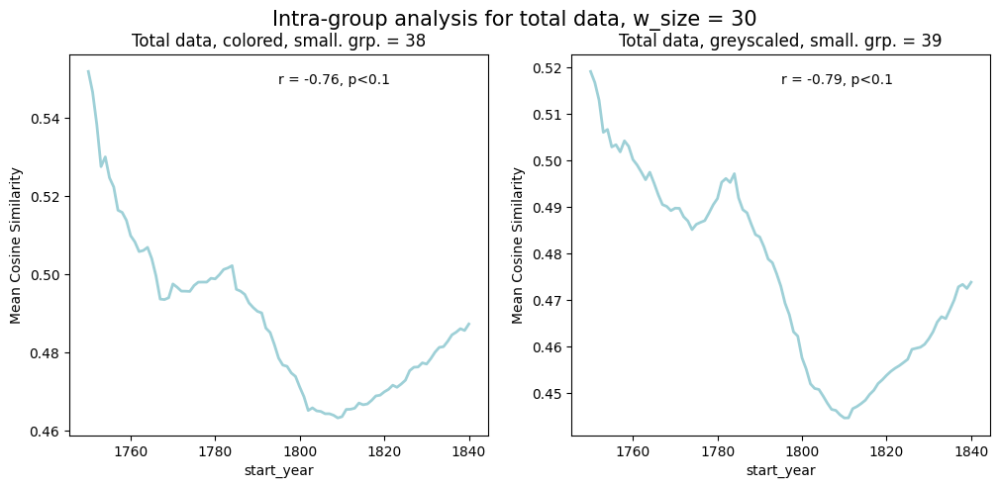

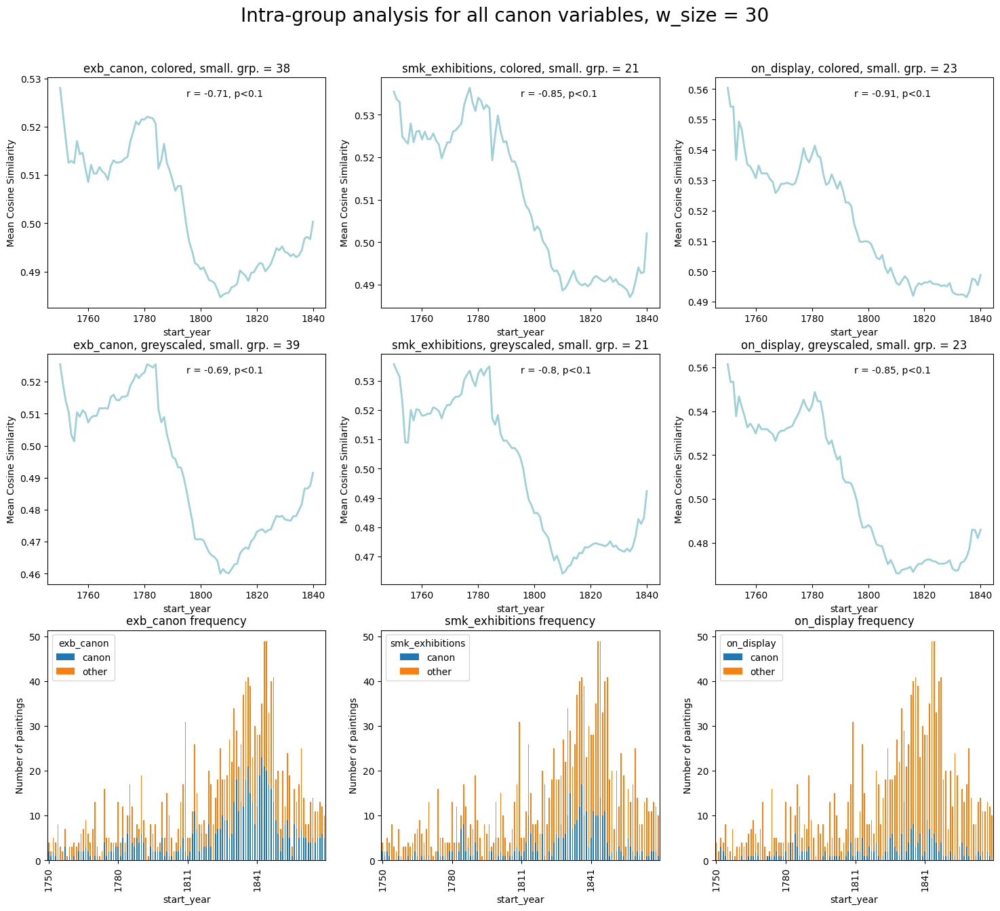

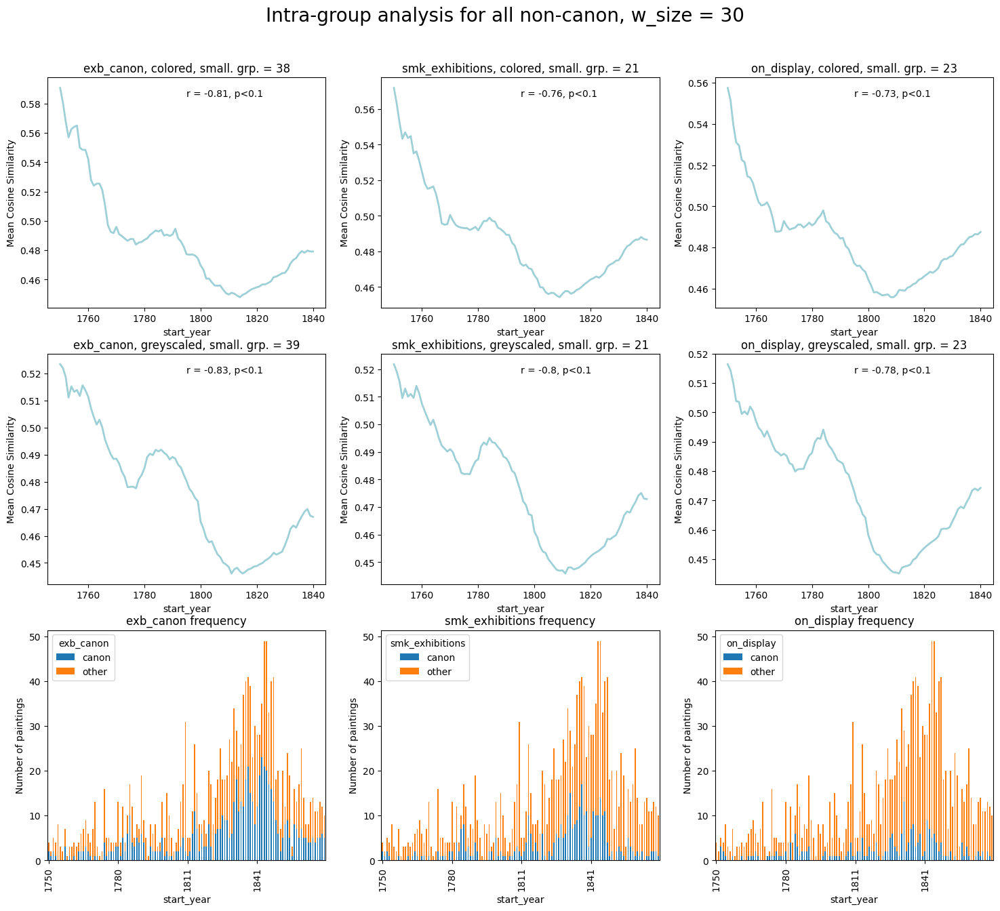

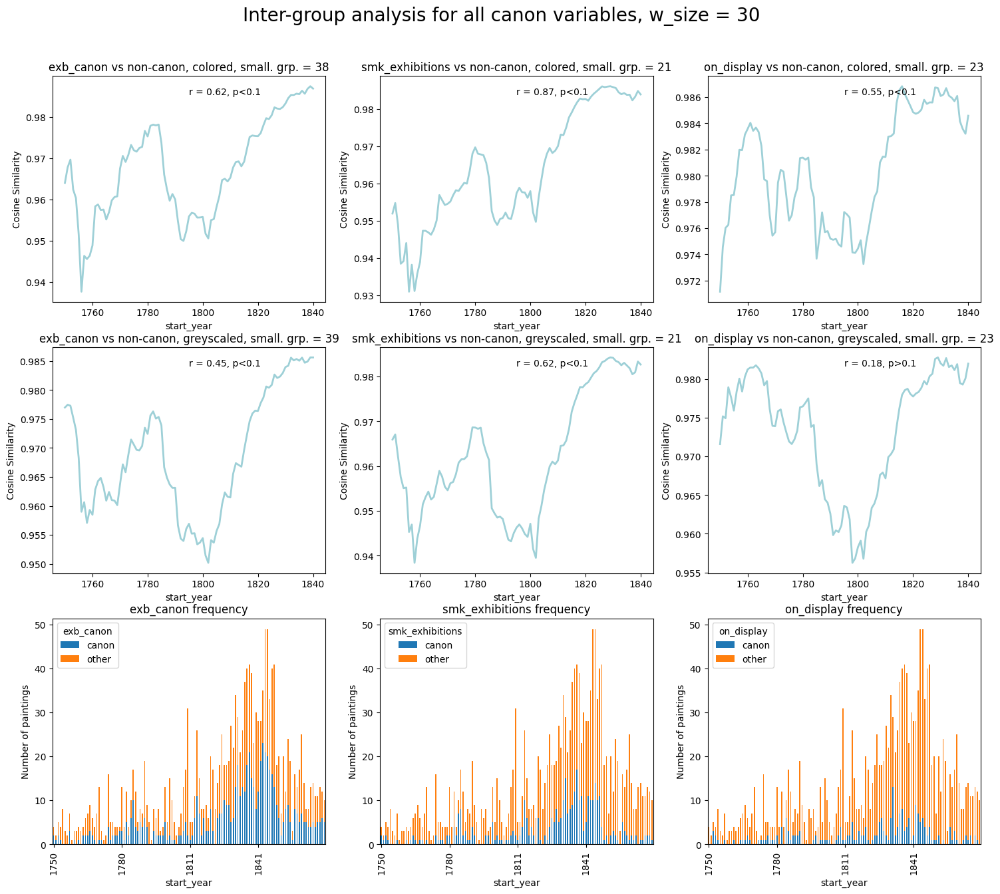

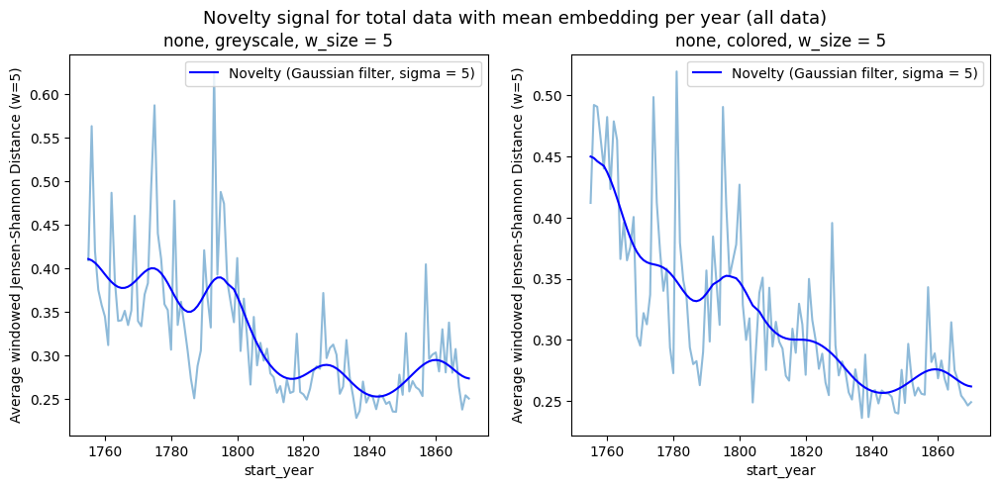

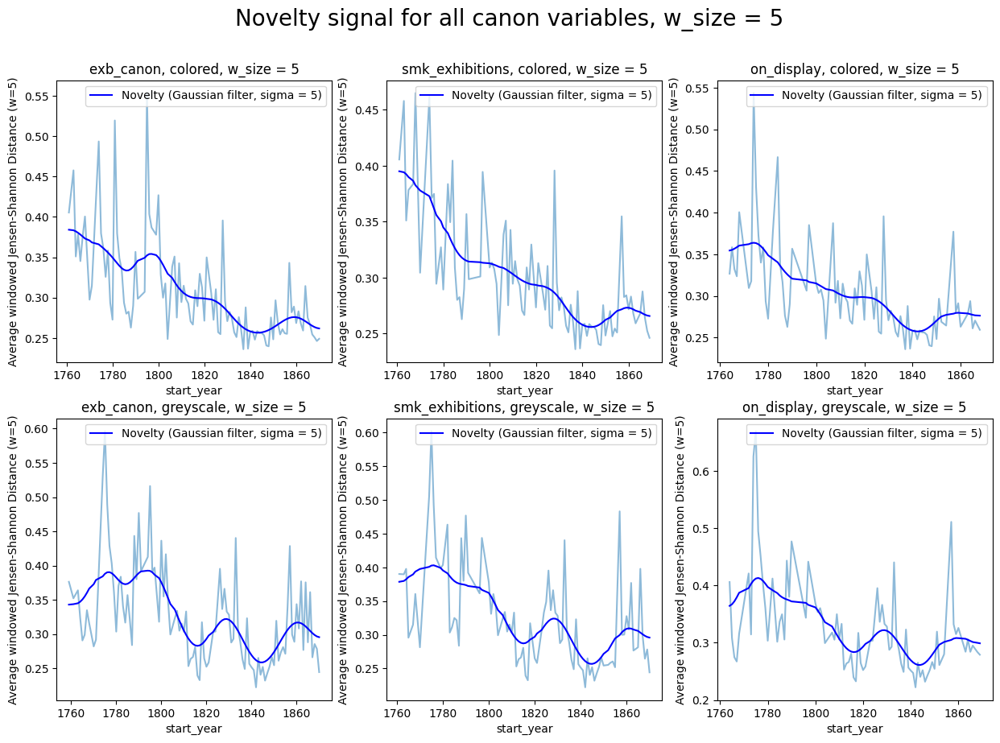

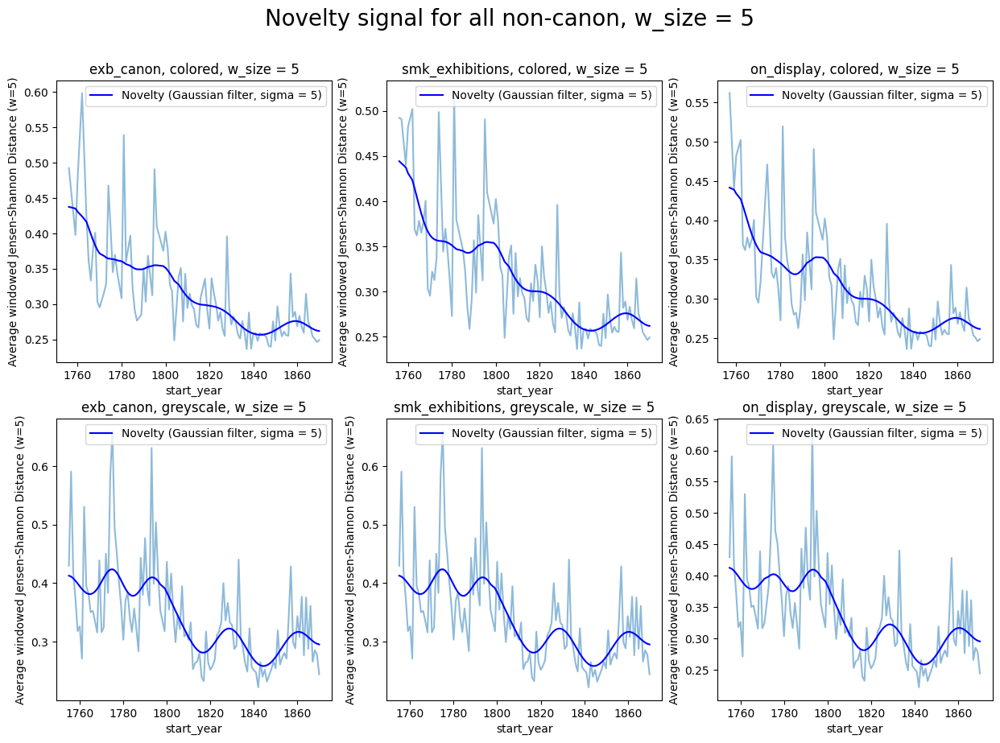

In [46]:
all_analyses_plots(df_new_prod_years_filtered, 'new_start_year', 'figs', 30, 5)

In [47]:
# remove certain nationalities
nationality_df = df_new_prod_years_filtered.copy()

In [48]:
df_lists = nationality_df[nationality_df['nationality'].apply(lambda x: isinstance(x, list) and len(x) > 1)]

In [49]:
df_lists['nationality']

202                               [Dansk, Dansk]
264                               [Dansk, Dansk]
381    [Hollandsk, Hollandsk, Flamsk, Hollandsk]
622                                 [<NA>, <NA>]
634                       [Italiensk, Italiensk]
645                       [Italiensk, Italiensk]
Name: nationality, dtype: object

In [50]:
nationality_df['nationality'].loc[202] = 'Dansk'
nationality_df['nationality'].loc[264] = 'Dansk'
nationality_df['nationality'].loc[381] = 'Hollandsk'
nationality_df['nationality'].loc[622] = pd.NA
nationality_df['nationality'].loc[634] = 'Italiensk'
nationality_df['nationality'].loc[645] = 'Italiensk'

In [51]:
nationality_df['nationality'] = nationality_df['nationality'].explode()

nationalities = ['Dansk', 'Tysk', 'Norsk', 'Svensk']

nationality_df_updated = nationality_df.loc[(nationality_df['nationality'].isin(nationalities))]

In [54]:
nationality_df_updated.reset_index(drop=True, inplace=True)

In [73]:
nationality_df_updated.to_pickle(os.path.join(data_path, 'df_filtered_nationalities.pkl'))

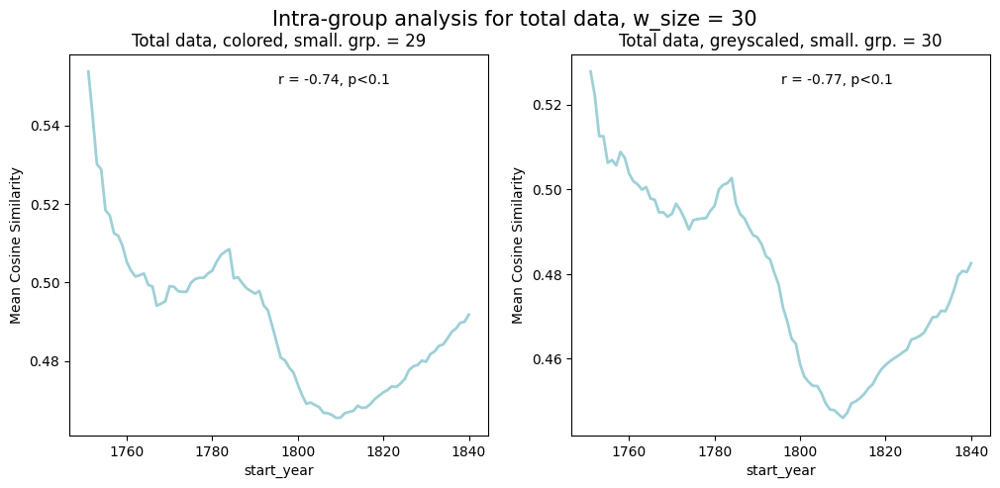

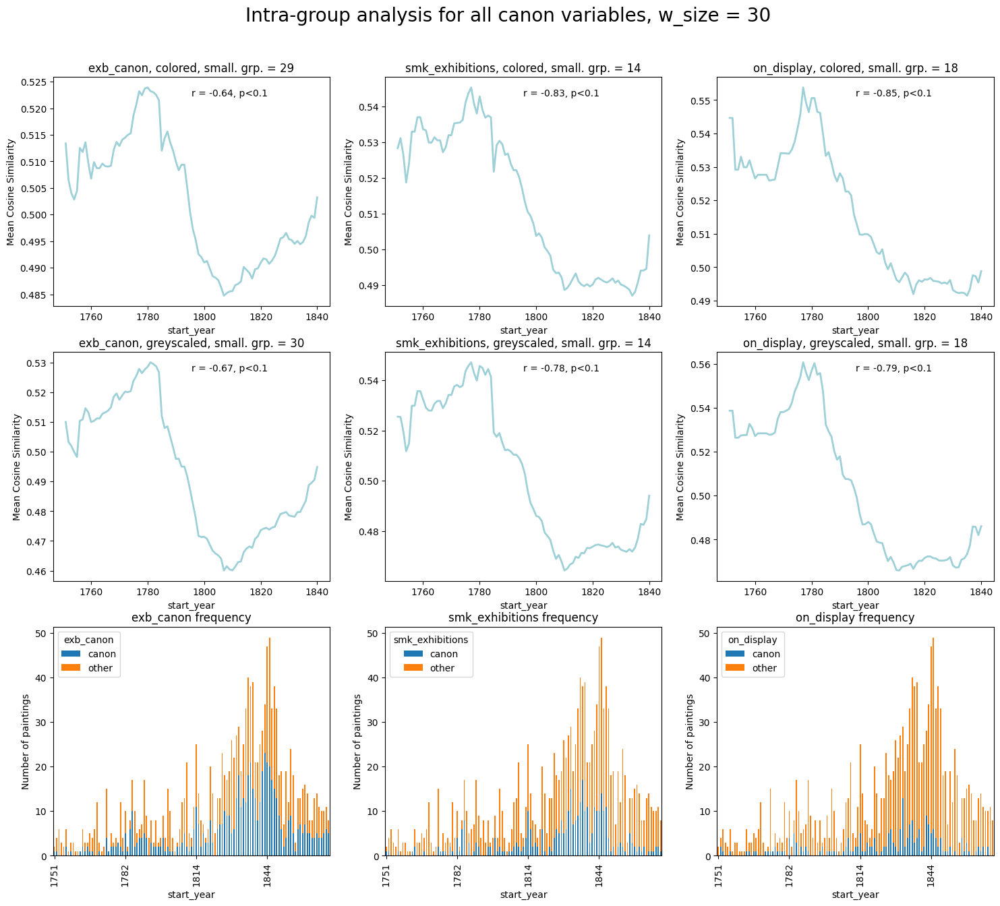

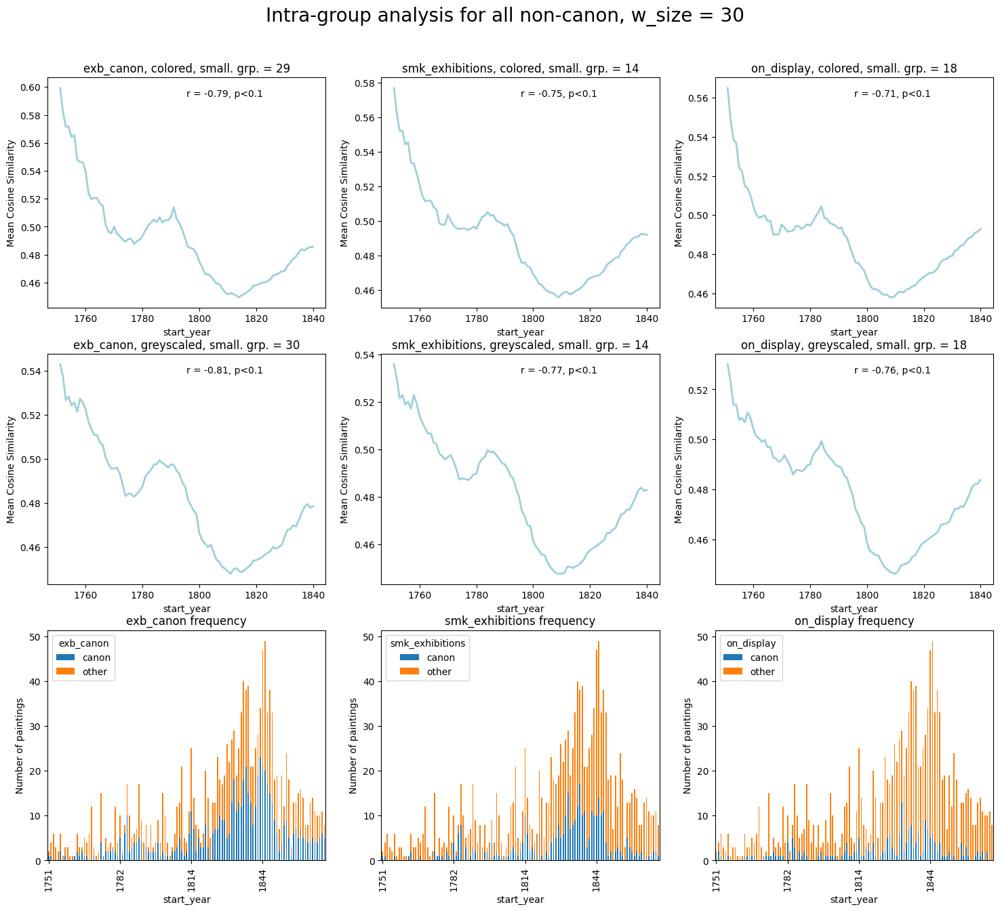

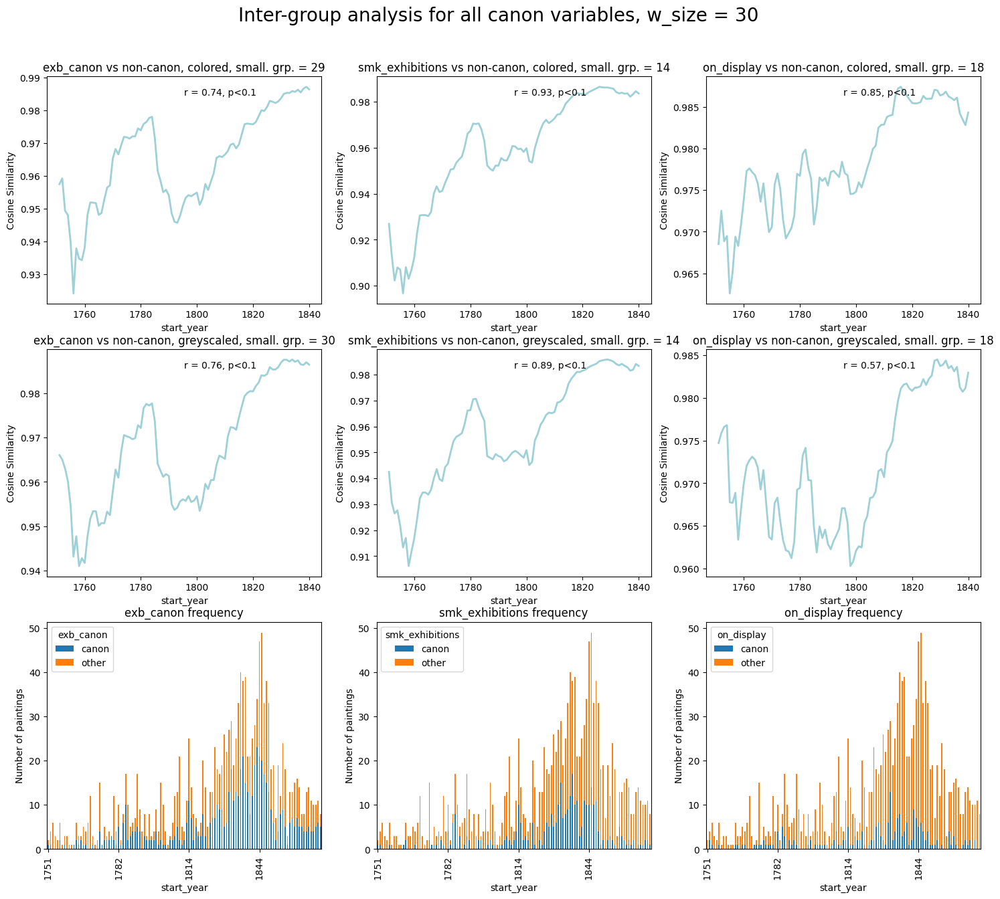

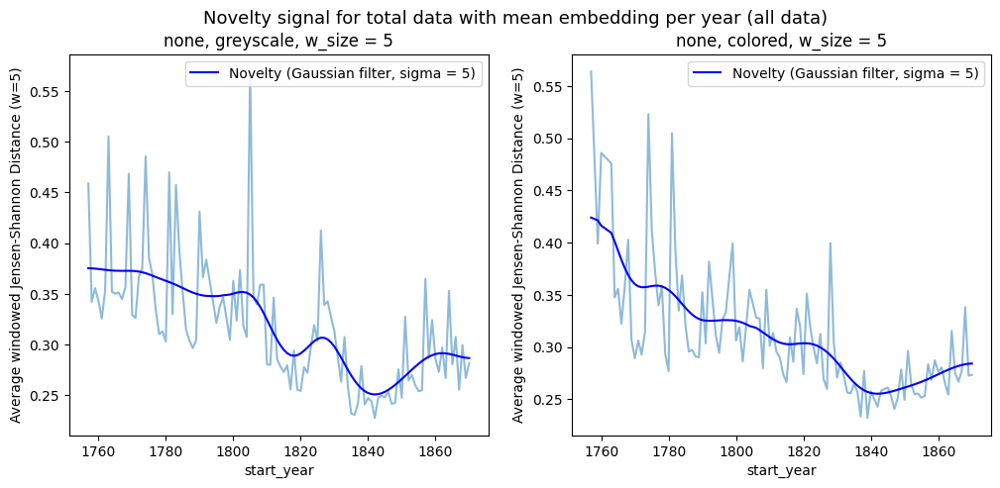

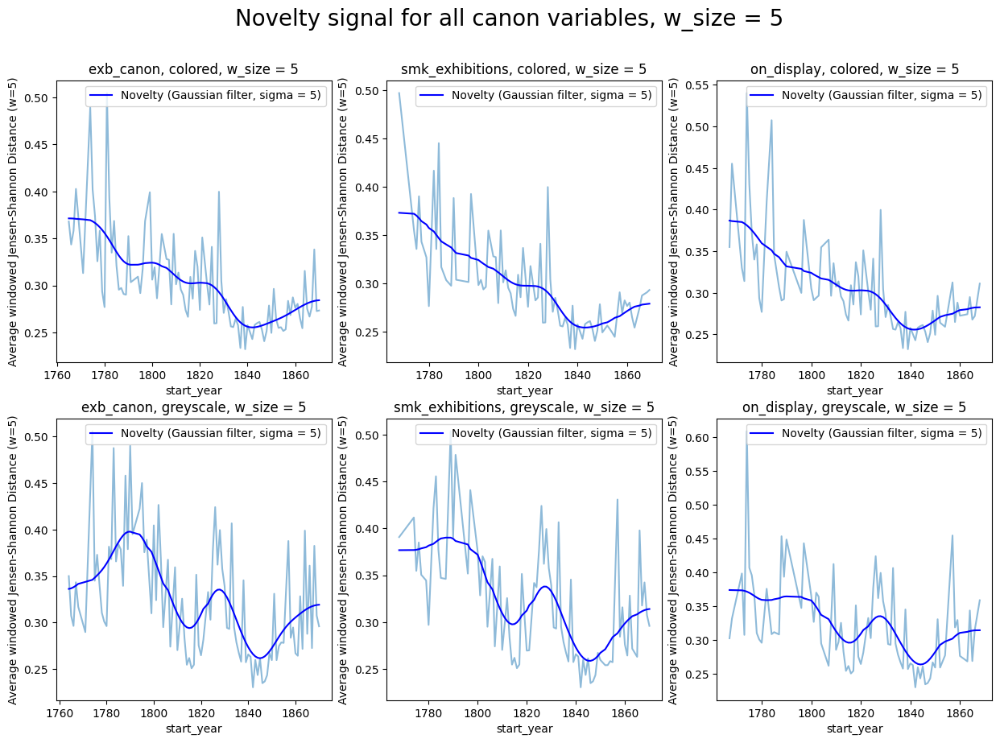

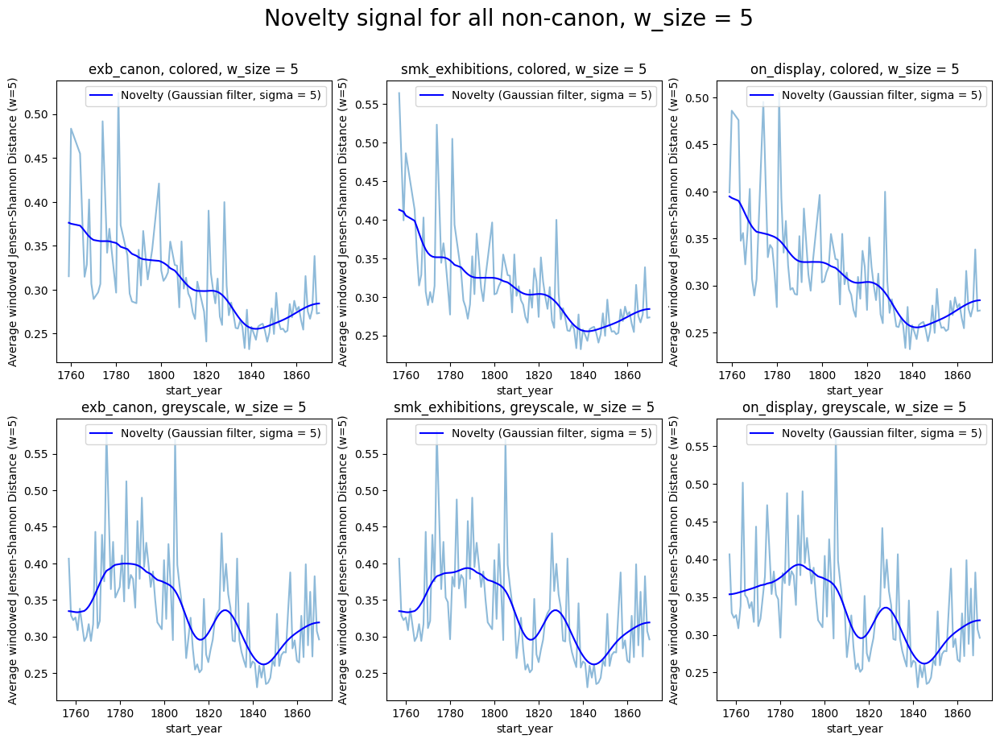

In [55]:
all_analyses_plots(nationality_df_updated, 'scandi', 'figs', 30, 5)

In [ ]:
# rerun supervised classification with new df